In [261]:
import numpy as np   
import pandas as pd    
import seaborn as sns
import matplotlib.pyplot as plt 
import warnings
warnings.filterwarnings('ignore')

In [2]:
#When working directory needs to be changed. Not required at this example though
#import os
#os.chdir('D:/Academic Operations/DSBA - Python/Blended/Predictive Modelling/Linear Regression/4')
#os.getcwd()

## Problem 1: Linear Regression
#### The comp-activ databases is a collection of a computer systems activity measures .
#### The data was collected from a Sun Sparcstation 20/712 with 128 Mbytes of memory running in a multi-user university department. Users would typically be doing a large variety of tasks ranging from accessing the internet, editing files or running very cpu-bound programs. 

#### As you are a budding data scientist you thought to find out a linear equation to build a model to predict 'usr'(Portion of time (%) that cpus run in user mode) and to find out how each attribute affects the system to be in 'usr' mode using a list of system attributes.

### Data Dictionary
System measures used:

lread - Reads (transfers per second ) between system memory and user memory

lwrite - writes (transfers per second) between system memory and user memory

scall - Number of system calls of all types per second

sread - Number of system read calls per second .

swrite - Number of system write calls per second .

fork - Number of system fork calls per second.

exec - Number of system exec calls per second.

rchar - Number of characters transferred per second by system read calls

wchar - Number of characters transfreed per second by system write calls

pgout - Number of page out requests per second

ppgout - Number of pages, paged out per second

pgfree - Number of pages per second placed on the free list.

pgscan - Number of pages checked if they can be freed per second

atch - Number of page attaches (satisfying a page fault by reclaiming a page in memory) per second

pgin - Number of page-in requests per second

ppgin - Number of pages paged in per second

pflt - Number of page faults caused by protection errors (copy-on-writes).

vflt - Number of page faults caused by address translation .

runqsz - Process run queue size (The number of kernel threads in memory that are waiting for a CPU to run.

Typically, this value should be less than 2. Consistently higher values mean that the system might be CPU-bound.)

freemem - Number of memory pages available to user processes

freeswap - Number of disk blocks available for page swapping.

#### usr - Portion of time (%) that cpus run in user mode


In [3]:
df_cm=pd.read_excel('compactiv.xlsx')

In [4]:
df_com=df_cm.copy()

### 1.1 Read the data and do exploratory data analysis. Describe the data briefly. (Check the Data types, shape, EDA, 5 point summary). Perform Univariate, Bivariate Analysis, Multivariate Analysis.

In [5]:
df_com.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,CPU_Bound,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,Not_CPU_Bound,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,Not_CPU_Bound,633,1760253,90


In [408]:
df_com.tail()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
8187,16,12,3009,360,244,1.6,5.81,405250.0,85282.0,8.02,...,55.11,0.6,35.87,47.90,139.28,270.74,CPU_Bound,387,986647,80
8188,4,0,1596,170,146,2.4,1.80,89489.0,41764.0,3.80,...,0.20,0.8,3.80,4.40,122.40,212.60,Not_CPU_Bound,263,1055742,90
8189,16,5,3116,289,190,0.6,0.60,325948.0,52640.0,0.40,...,0.00,0.4,28.40,45.20,60.20,219.80,Not_CPU_Bound,400,969106,87
8190,32,45,5180,254,179,1.2,1.20,62571.0,29505.0,1.40,...,18.04,0.4,23.05,24.25,93.19,202.81,CPU_Bound,141,1022458,83
8191,2,0,985,55,46,1.6,4.80,111111.0,22256.0,0.00,...,0.00,0.2,3.40,6.20,91.80,110.00,CPU_Bound,659,1756514,94


In [409]:
#Check the shape of the dataset
df_com.shape

(8192, 22)

In [401]:
df_com.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [423]:
df_com.describe().T

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.0,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.0,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.0,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.0,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.0,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.4,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.2,1.2,2.800,59.56
rchar,8088.0,1.973857e+05,239837.493526,278.0,34091.5,125473.5,267828.750,2526649.00
wchar,8177.0,9.590299e+04,140841.707911,1498.0,22916.0,46619.0,106101.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.0,0.0,2.400,81.44


In [422]:
df_com.describe(include='object').T

,count,unique,top,freq
runqsz,8192,2,Not_CPU_Bound,4331


In [424]:
df_com.skew()

lread       13.897852
lwrite       5.277645
scall        0.902531
sread        5.459466
swrite       9.605844
fork         2.249689
exec         4.069238
rchar        2.854044
wchar        3.847654
pgout        5.066984
ppgout       4.680442
pgfree       4.768191
pgscan       5.813415
atch        21.542020
pgin         3.242412
ppgin        3.902765
pflt         1.720284
vflt         1.737327
freemem      1.807555
freeswap    -0.791664
usr         -3.416750
dtype: float64

## EDA

## Univariate Analysis

In [410]:
df_com.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap', 'usr'],
      dtype='object')

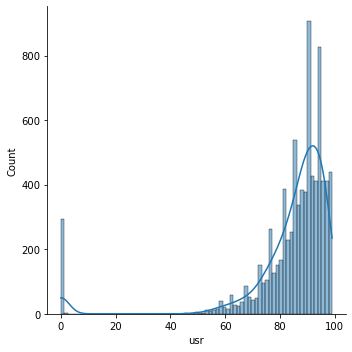

In [411]:
# Now, let us look at the distribution plot of the Y_train variable
sns.displot(df_com['usr'], kde=True)
plt.show()

Text(0.5, 1.0, 'Number of system calls of all types per second')

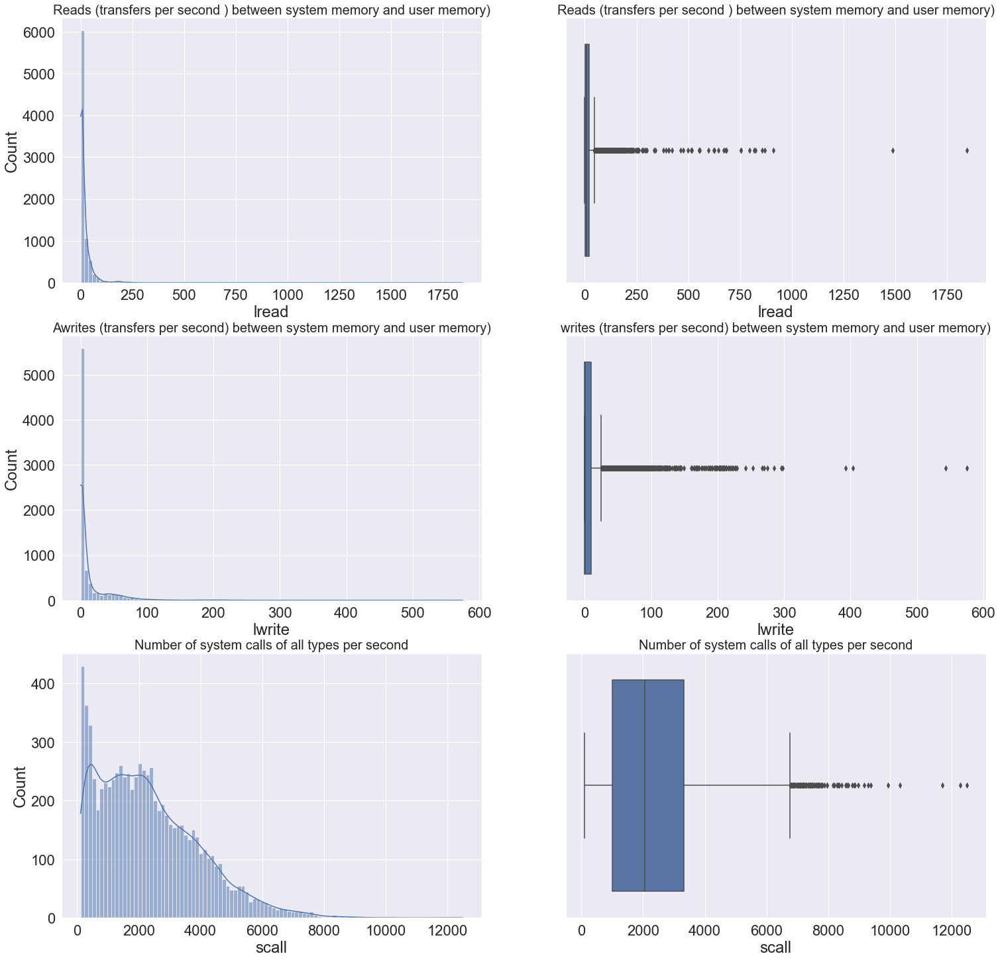

In [444]:
fig,axes= plt.subplots(nrows=3, ncols=2, figsize=(25,25))
a = sns.histplot(x='lread', data=df_com, ax=axes[0,0] , kde = True,bins=100)
a.set_title("Reads (transfers per second ) between system memory and user memory)",fontsize=20)
a = sns.boxplot(x='lread', data=df_com, ax=axes[0,1])
a.set_title("Reads (transfers per second ) between system memory and user memory)",fontsize=20)

a = sns.histplot(x='lwrite', data=df_com, ax=axes[1,0] , kde = True,bins=100)
a.set_title("Awrites (transfers per second) between system memory and user memory)",fontsize=20)
a = sns.boxplot(x='lwrite', data=df_com, ax=axes[1,1])
a.set_title("writes (transfers per second) between system memory and user memory)",fontsize=20)

a = sns.histplot(x='scall', data=df_com, ax=axes[2,0] , kde = True,bins=100)
a.set_title("Number of system calls of all types per second",fontsize=20)
a = sns.boxplot(x='scall', data=df_com, ax=axes[2,1])
a.set_title("Number of system calls of all types per second",fontsize=20)

Text(0.5, 1.0, 'Number of system fork calls per second')

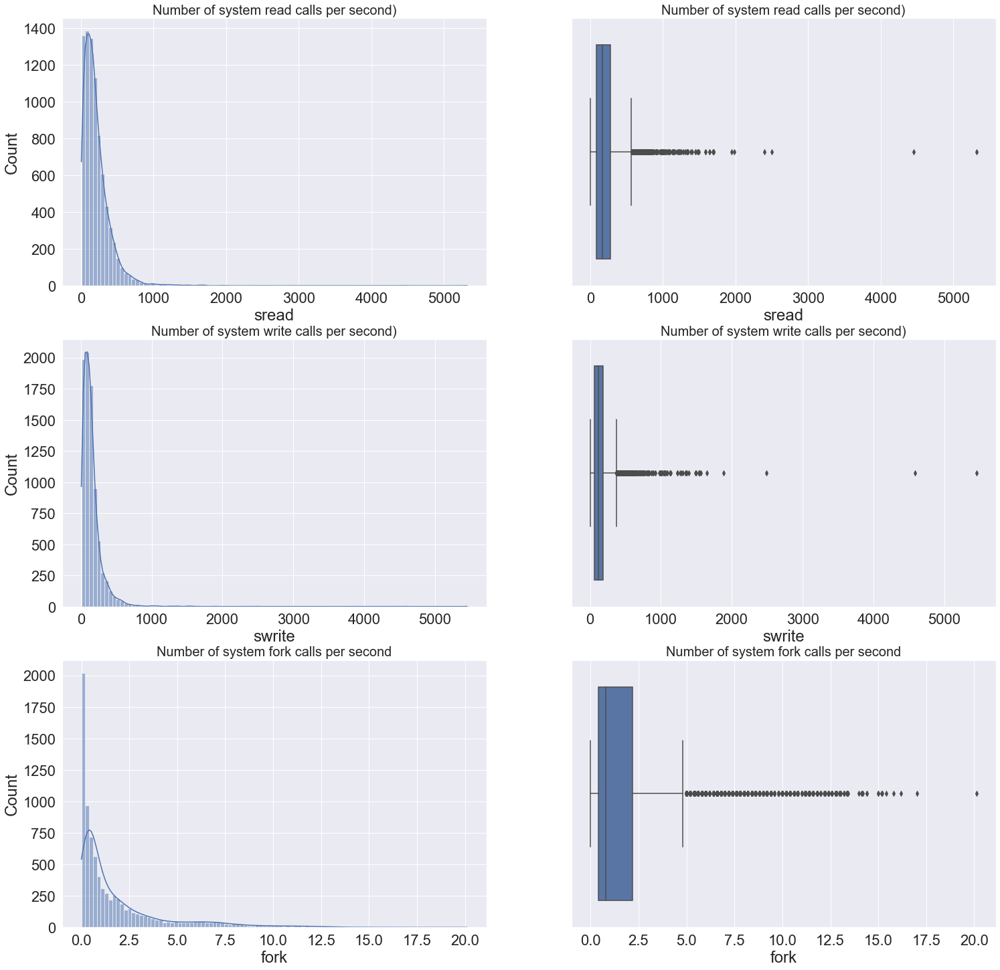

In [446]:
fig,axes= plt.subplots(nrows=3, ncols=2, figsize=(25,25))
sns.set(font_scale = 2)
a = sns.histplot(x='sread', data=df_com, ax=axes[0,0] , kde = True,bins=100)
a.set_title("Number of system read calls per second)",fontsize=20)
a = sns.boxplot(x='sread', data=df_com, ax=axes[0,1])
a.set_title("Number of system read calls per second)",fontsize=20)

a = sns.histplot(x='swrite', data=df_com, ax=axes[1,0] , kde = True,bins=100)
a.set_title("Number of system write calls per second)",fontsize=20)
a = sns.boxplot(x='swrite', data=df_com, ax=axes[1,1])
a.set_title("Number of system write calls per second)",fontsize=20)

a = sns.histplot(x='fork', data=df_com, ax=axes[2,0] , kde = True,bins=100)
a.set_title("Number of system fork calls per second",fontsize=20)
a = sns.boxplot(x='fork', data=df_com, ax=axes[2,1])
a.set_title("Number of system fork calls per second",fontsize=20)

Text(0.5, 1.0, 'Number of characters transfreed per second by system write calls')

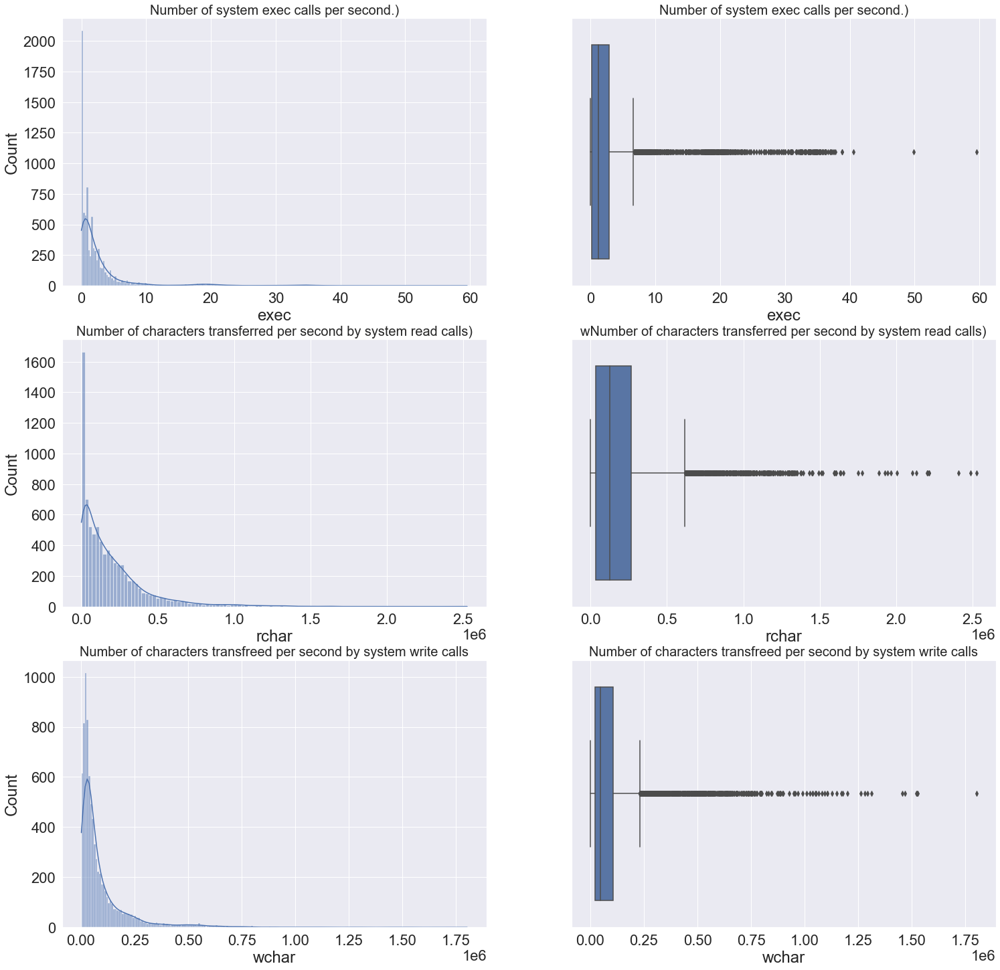

In [447]:
fig,axes= plt.subplots(nrows=3, ncols=2, figsize=(25,25))
sns.set(font_scale = 2)
a = sns.histplot(x='exec', data=df_com, ax=axes[0,0] , kde = True)
a.set_title("Number of system exec calls per second.)",fontsize=20)
a = sns.boxplot(x='exec', data=df_com, ax=axes[0,1])
a.set_title("Number of system exec calls per second.)",fontsize=20)

a = sns.histplot(x='rchar', data=df_com, ax=axes[1,0] , kde = True)
a.set_title("Number of characters transferred per second by system read calls)",fontsize=20)
a = sns.boxplot(x='rchar', data=df_com, ax=axes[1,1])
a.set_title("wNumber of characters transferred per second by system read calls)",fontsize=20)

a = sns.histplot(x='wchar', data=df_com, ax=axes[2,0] , kde = True)
a.set_title("Number of characters transfreed per second by system write calls",fontsize=20)
a = sns.boxplot(x='wchar', data=df_com, ax=axes[2,1])
a.set_title("Number of characters transfreed per second by system write calls",fontsize=20)

Text(0.5, 1.0, 'Number of pages per second placed on the free list)')

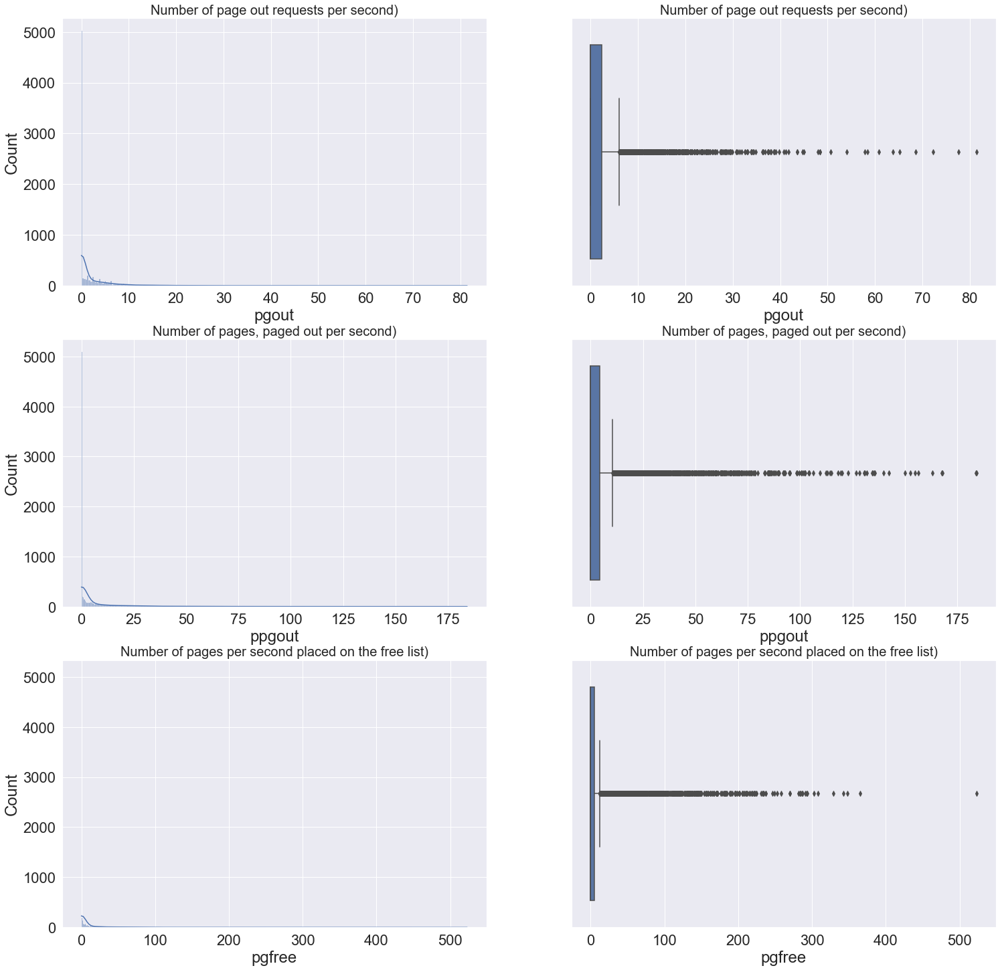

In [449]:
fig,axes= plt.subplots(nrows=3, ncols=2, figsize=(25,25))
sns.set(font_scale = 2)
a = sns.histplot(x='pgout', data=df_com, ax=axes[0,0] , kde = True)
a.set_title("Number of page out requests per second)",fontsize=20)
a = sns.boxplot(x='pgout', data=df_com, ax=axes[0,1])
a.set_title("Number of page out requests per second)",fontsize=20)

a = sns.histplot(x='ppgout', data=df_com, ax=axes[1,0] , kde = True)
a.set_title("Number of pages, paged out per second)",fontsize=20)
a = sns.boxplot(x='ppgout', data=df_com, ax=axes[1,1])
a.set_title("Number of pages, paged out per second)",fontsize=20)

a = sns.histplot(x='pgfree', data=df_com, ax=axes[2,0] , kde = True)
a.set_title("Number of pages per second placed on the free list)",fontsize=20)
a = sns.boxplot(x='pgfree', data=df_com, ax=axes[2,1])
a.set_title("Number of pages per second placed on the free list)",fontsize=20)


Text(0.5, 1.0, 'Number of page-in requests per second)')

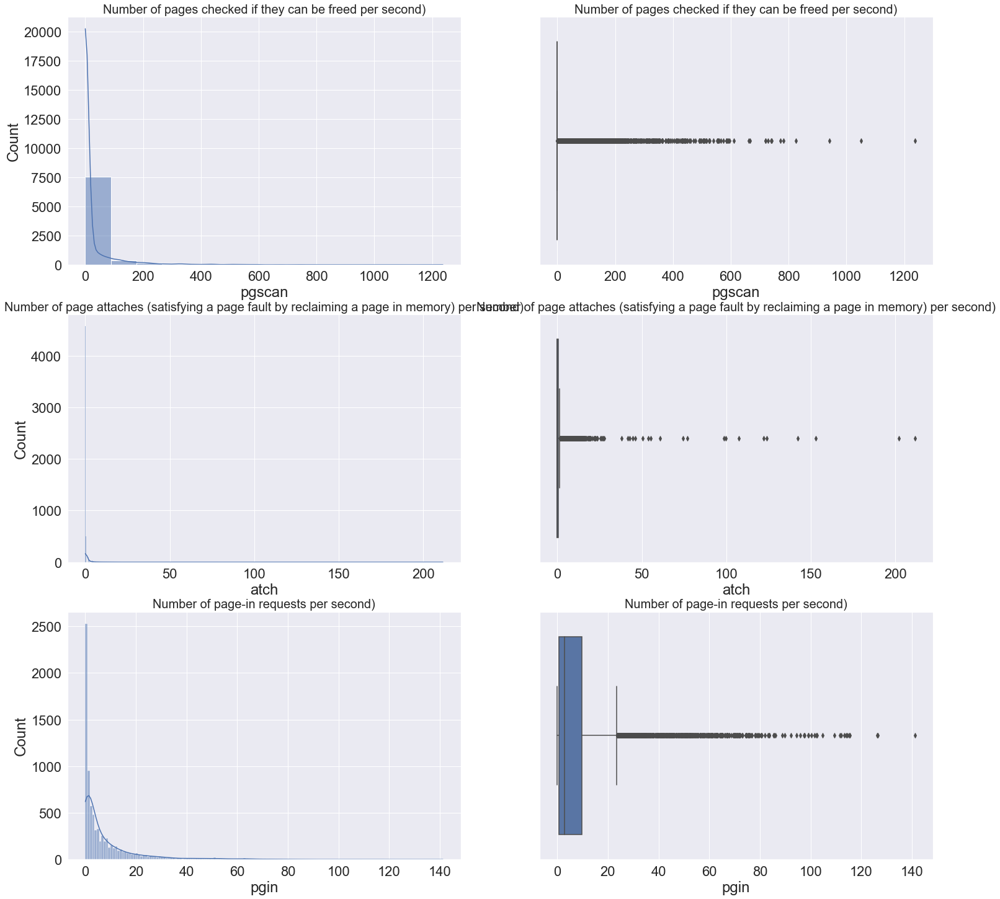

In [452]:
fig,axes= plt.subplots(nrows=3, ncols=2, figsize=(25,25))
sns.set(font_scale = 2)
a = sns.histplot(x='pgscan', data=df_com, ax=axes[0,0] , kde = True)
a.set_title("Number of pages checked if they can be freed per second)",fontsize=20)
a = sns.boxplot(x='pgscan', data=df_com, ax=axes[0,1])
a.set_title("Number of pages checked if they can be freed per second)",fontsize=20)

a = sns.histplot(x='atch', data=df_com, ax=axes[1,0] , kde = True)
a.set_title("Number of page attaches (satisfying a page fault by reclaiming a page in memory) per second)",fontsize=20)
a = sns.boxplot(x='atch', data=df_com, ax=axes[1,1])
a.set_title("Number of page attaches (satisfying a page fault by reclaiming a page in memory) per second)",fontsize=20)

a = sns.histplot(x='pgin', data=df_com, ax=axes[2,0] , kde = True)
a.set_title("Number of page-in requests per second)",fontsize=20)
a = sns.boxplot(x='pgin', data=df_com, ax=axes[2,1])
a.set_title("Number of page-in requests per second)",fontsize=20)


Text(0.5, 1.0, 'Number of page faults caused by address translation)')

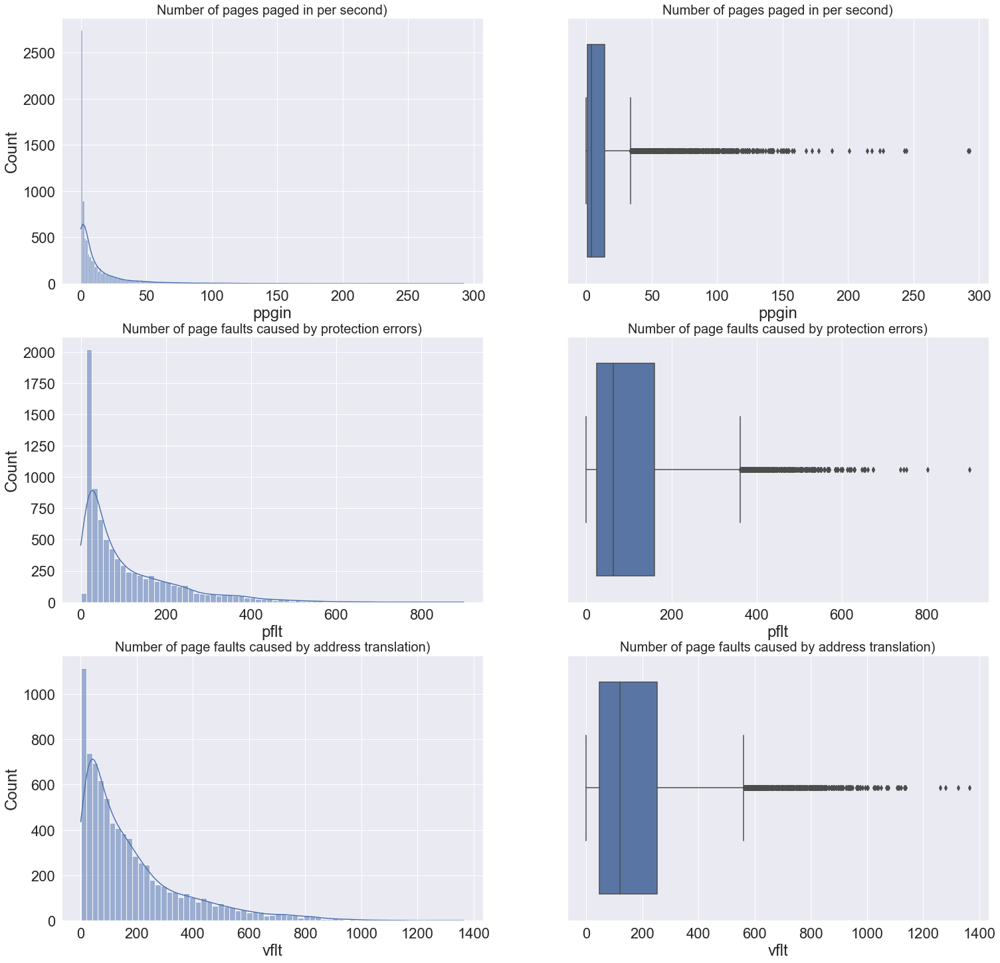

In [451]:
fig,axes= plt.subplots(nrows=3, ncols=2, figsize=(25,25))
sns.set(font_scale = 2)
a = sns.histplot(x='ppgin', data=df_com, ax=axes[0,0] , kde = True)
a.set_title("Number of pages paged in per second)",fontsize=20)
a = sns.boxplot(x='ppgin', data=df_com, ax=axes[0,1])
a.set_title("Number of pages paged in per second)",fontsize=20)

a = sns.histplot(x='pflt', data=df_com, ax=axes[1,0] , kde = True)
a.set_title("Number of page faults caused by protection errors)",fontsize=20)
a = sns.boxplot(x='pflt', data=df_com, ax=axes[1,1])
a.set_title("Number of page faults caused by protection errors)",fontsize=20)

a = sns.histplot(x='vflt', data=df_com, ax=axes[2,0] , kde = True)
a.set_title("Number of page faults caused by address translation)",fontsize=20)
a = sns.boxplot(x='vflt', data=df_com, ax=axes[2,1])
a.set_title("Number of page faults caused by address translation)",fontsize=20)


Text(0.5, 1.0, 'Number of disk blocks available for page swapping')

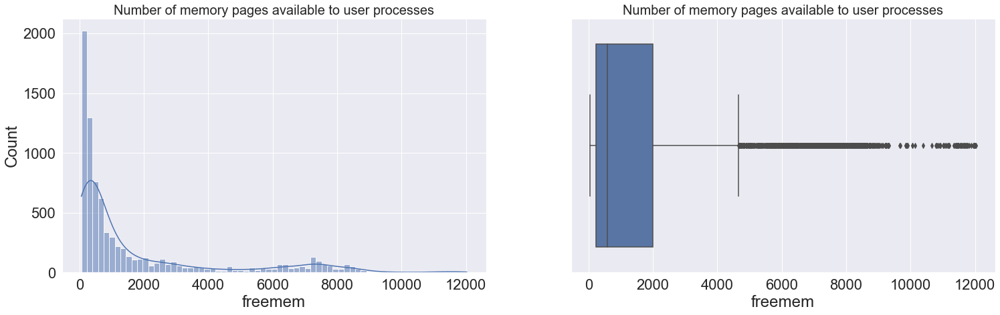

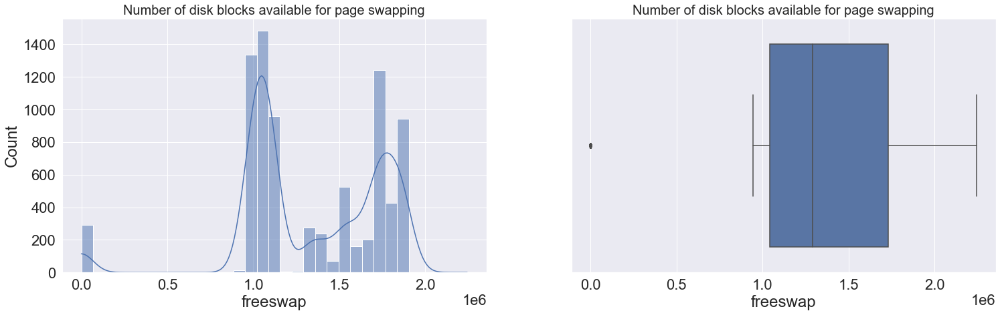

In [460]:
fig,axes= plt.subplots(nrows=1, ncols=2, figsize=(25,7))
sns.set(font_scale = 2)
a=sns.histplot(x='freemem', data=df_com, ax=axes[0],kde=True)
a.set_title('Number of memory pages available to user processes',fontsize=20)
sns.boxplot(x='freemem', data=df_com, ax=axes[1])
plt.title('Number of memory pages available to user processes',fontsize=20)

fig,axes= plt.subplots(nrows=1, ncols=2, figsize=(25,7))
a=sns.histplot(x='freeswap', data=df_com, ax=axes[0],kde=True)
a.set_title('Number of disk blocks available for page swapping',fontsize=20)
sns.boxplot(x='freeswap', data=df_com, ax=axes[1])
plt.title('Number of disk blocks available for page swapping',fontsize=20)

Looking at the box plot, it seems that all numerical variables have outlier values.
All the numerical variable have outler values in upper wisker except 'freeswap' which has only 1 outlier in lower wisker.

These outliers value needs to be treated and there are several ways of treating them:

Drop the outlier value
Replace the outlier value using the IQR
Created a user definded function for finding the lower and upper range for a variable so that outlier can be treated.

Text(0.5, 1.0, ' Process run queue size (The number of kernel threads in memory that are waiting for a CPU to run.')

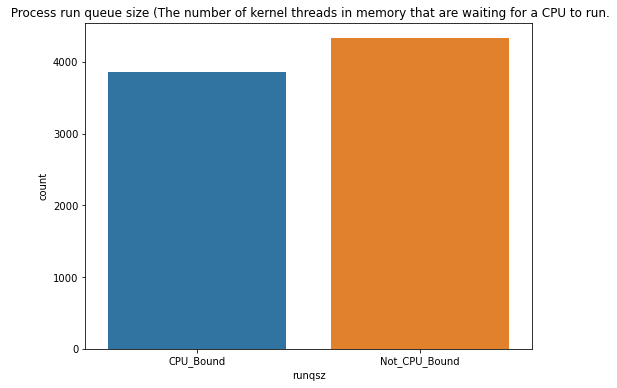

In [417]:
plt.figure(figsize=(8,6))
sns.countplot(x='runqsz',data=df_com)   #countplot for Education
plt.title(' Process run queue size (The number of kernel threads in memory that are waiting for a CPU to run.',fontsize=12)

From the above graph we can interpret that majority of the cpu are not cpu bound category.so that means the values are less than 2 for not cpu bound. Consistently higher values mean that the system might be CPU-bound.) 

## Bivariate Analysis

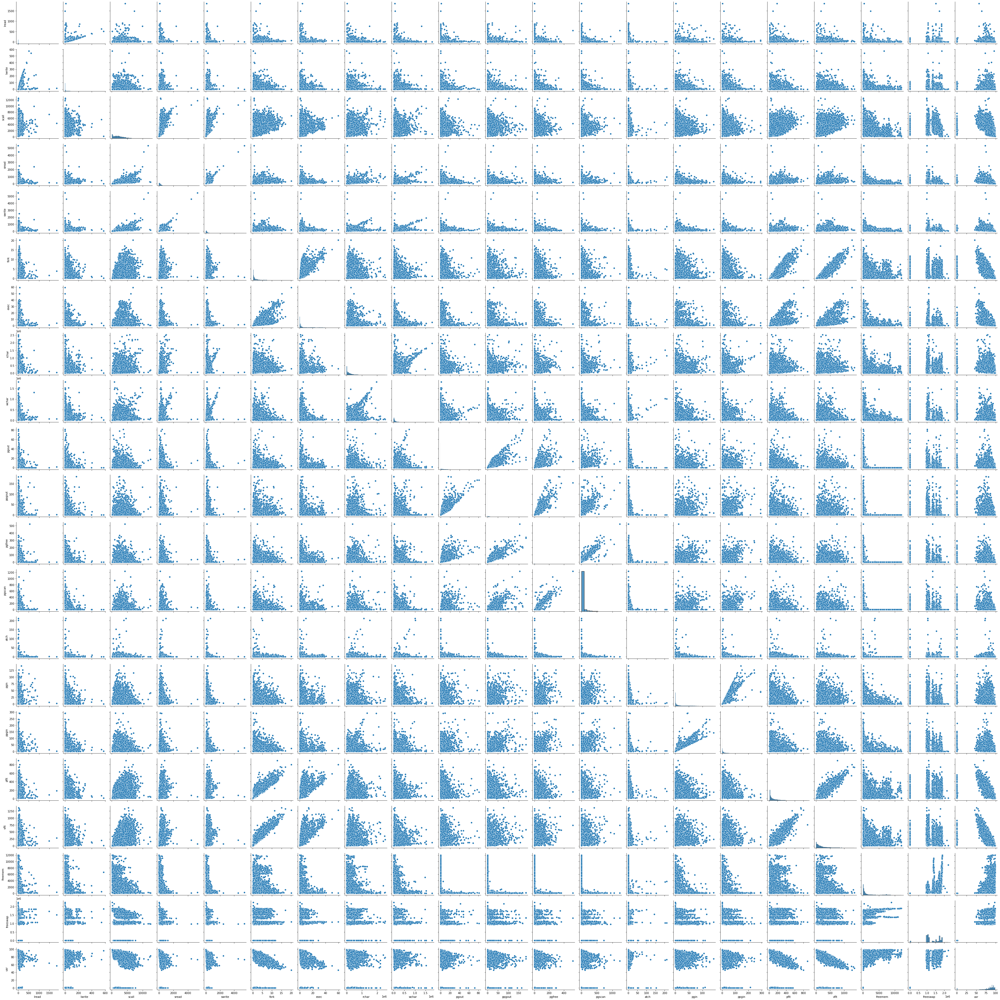

In [32]:
#Pairplot of all variables
sns.pairplot(data = df_com)

In [33]:
cor = df_com.corr()
cor

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgfree,pgscan,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr
lread,1.000000,0.533737,0.191377,0.132881,0.119953,0.140284,0.110965,0.107997,0.081353,0.082463,...,0.114438,0.087783,0.021563,0.189799,0.161345,0.137463,0.165539,-0.083214,-0.081293,-0.141394
lwrite,0.533737,1.000000,0.143404,0.128403,0.101524,0.052511,0.038237,0.114315,0.091388,0.067013,...,0.065692,0.042608,0.028310,0.091068,0.089011,0.067024,0.094965,-0.091133,-0.116478,-0.111213
scall,0.191377,0.143404,1.000000,0.696887,0.619984,0.446766,0.308999,0.349148,0.273796,0.194529,...,0.199778,0.177908,0.077969,0.241628,0.219070,0.481781,0.531760,-0.387520,-0.350629,-0.323188
sread,0.132881,0.128403,0.696887,1.000000,0.881069,0.416721,0.164084,0.499998,0.401427,0.193679,...,0.212911,0.194272,0.085468,0.207012,0.210225,0.452020,0.491045,-0.286437,-0.302036,-0.332160
swrite,0.119953,0.101524,0.619984,0.881069,1.000000,0.376876,0.103643,0.330156,0.393929,0.151371,...,0.145458,0.120180,0.061373,0.147000,0.144278,0.396580,0.416571,-0.248574,-0.237062,-0.272252
fork,0.140284,0.052511,0.446766,0.416721,0.376876,1.000000,0.763974,0.279594,0.060854,0.130192,...,0.168082,0.160839,0.047194,0.163468,0.132181,0.931040,0.939348,-0.123357,-0.130442,-0.363277
exec,0.110965,0.038237,0.308999,0.164084,0.103643,0.763974,1.000000,0.167630,0.000715,0.111465,...,0.146163,0.144855,0.052307,0.186099,0.149911,0.645239,0.691754,-0.158565,-0.153347,-0.288526
rchar,0.107997,0.114315,0.349148,0.499998,0.330156,0.279594,0.167630,1.000000,0.499569,0.210670,...,0.277018,0.258730,0.167091,0.298843,0.346676,0.311637,0.362042,-0.148509,-0.218712,-0.326262
wchar,0.081353,0.091388,0.273796,0.401427,0.393929,0.060854,0.000715,0.499569,1.000000,0.192361,...,0.158884,0.113368,0.181418,0.177501,0.200481,0.086193,0.111078,-0.148928,-0.225880,-0.289036
pgout,0.082463,0.067013,0.194529,0.193679,0.151371,0.130192,0.111465,0.210670,0.192361,1.000000,...,0.730381,0.553916,0.147759,0.385648,0.414865,0.151285,0.229129,-0.269687,-0.245378,-0.221877


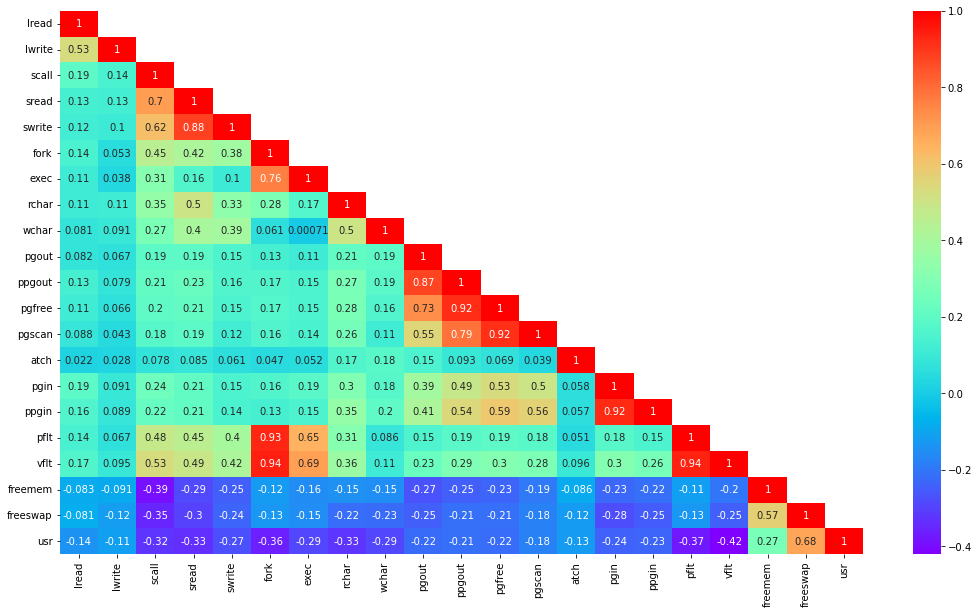

In [34]:
plt.figure(figsize=(18,10))

sns.heatmap(cor,annot=True,mask=np.triu(cor,+1),cmap='rainbow');

In [7]:
from scipy.stats import pearsonr

In [395]:
df_com.runqsz.value_counts()

0    4331
1    3861
Name: runqsz, dtype: int64

In [27]:
df_com.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap', 'usr'],
      dtype='object')

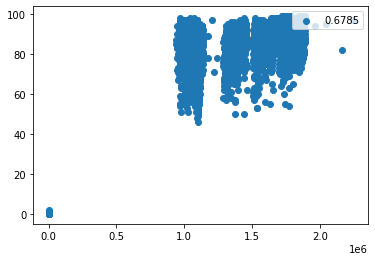

In [8]:
#Checking for linear relationship between Sales & Price
plt.scatter(df_com['freeswap'],df_com['usr'],label=round(pearsonr(df_com['freeswap'],df_com['usr'])[0],4))
plt.legend(loc = 'upper right');

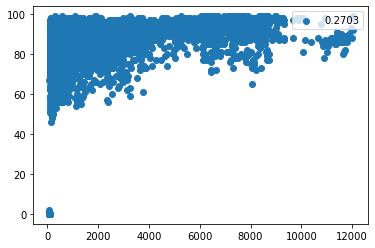

In [9]:
#Checking for linear relationship between Sales & Price
plt.scatter(df_com['freemem'],df_com['usr'],label=round(pearsonr(df_com['freemem'],df_com['usr'])[0],4))
plt.legend(loc = 'upper right');

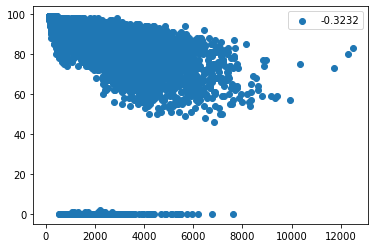

In [30]:
#Checking for linear relationship between Sales & Price
plt.scatter(df_com['scall'],df_com['usr'],label=round(pearsonr(df_com['scall'],df_com['usr'])[0],4))
plt.legend(loc = 'upper right');

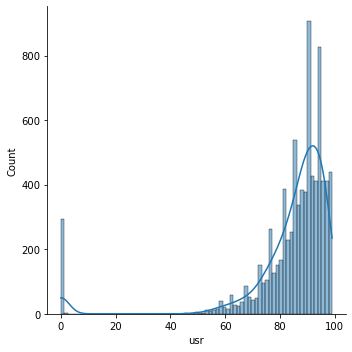

In [35]:
#sns.distplot(df['usr'])
sns.displot(df_com['usr'], kde=True)
plt.show()

#### Regarding correlation:

#### Values closer to 1 show a high correlation, and values closer to 0 show the lowest correlation.
#### A positive correlation value shows that the variables are positively correlated. For example, taller individuals usually weigh more.
#### A negative correlation value shows that the variables are negatively correlated.

## Multivariate analysis

In [390]:
df_com.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap', 'usr'],
      dtype='object')

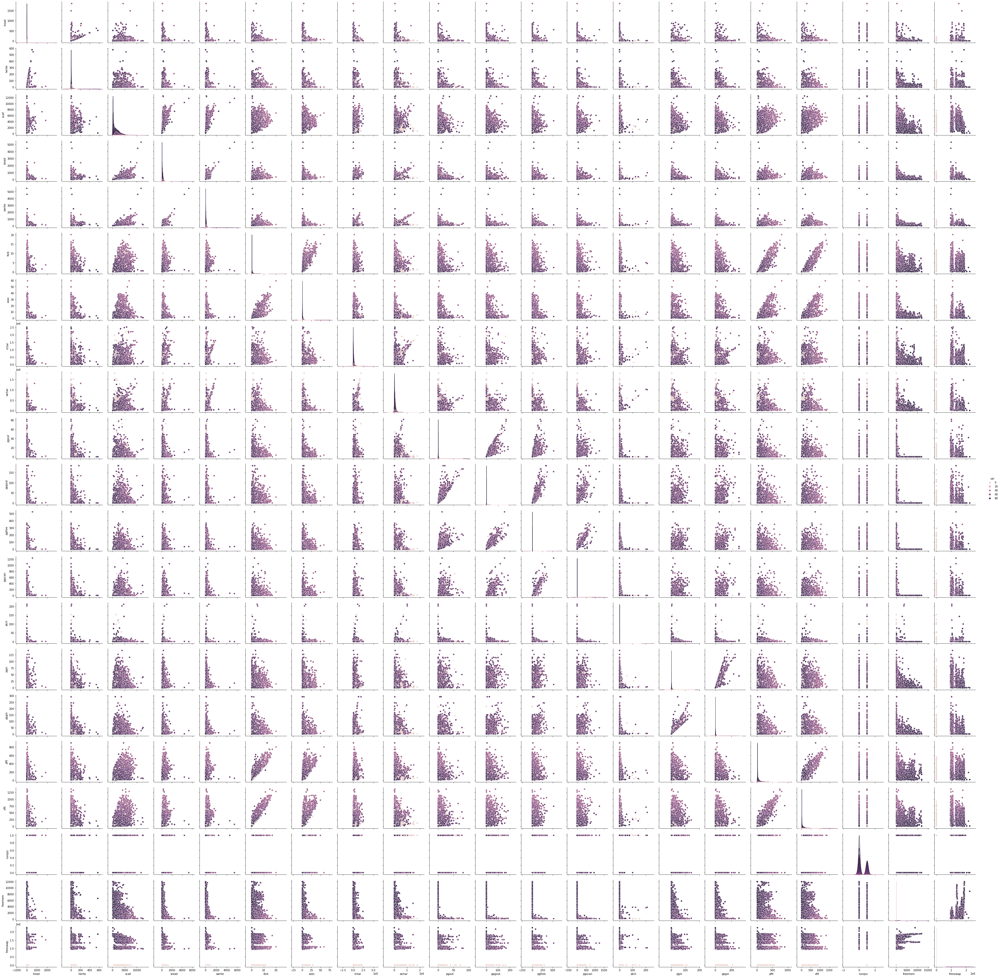

In [386]:
sns.pairplot(df_com,hue='usr');

### 1.2 Impute null values if present, also check for the values which are equal to zero. Do they have any meaning or do we need to change them or drop them? Check for the possibility of creating new features if required. Also check for outliers and duplicates if there.

#### Check for missing values and impute the missing values

In [8]:
df_com.isnull().sum()

lread         0
lwrite        0
scall         0
sread         0
swrite        0
fork          0
exec          0
rchar       104
wchar        15
pgout         0
ppgout        0
pgfree        0
pgscan        0
atch          0
pgin          0
ppgin         0
pflt          0
vflt          0
runqsz        0
freemem       0
freeswap      0
usr           0
dtype: int64

In [10]:
df_com[df_com['rchar'].isnull()]

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.2,220.2,Not_CPU_Bound,702,1021237,87
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.6,16.8,Not_CPU_Bound,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.8,47.6,Not_CPU_Bound,633,1760253,90
5,0,0,1201,65,61,0.4,0.4,NaN,58703.0,0.0,...,0.0,0.0,0.0,0.0,28.4,34.4,Not_CPU_Bound,6854,1877461,96
6,1,0,5744,168,190,0.2,0.2,NaN,189975.0,6.0,...,0.0,4.4,0.6,0.6,27.4,28.6,Not_CPU_Bound,312,1013458,89
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101,81,80,1086,134,81,0.4,0.4,NaN,NaN,3.6,...,18.2,1.6,2.0,2.2,35.4,102.8,Not_CPU_Bound,129,991770,92
102,7,2,2342,125,74,2.2,4.2,NaN,NaN,10.6,...,152.2,1.0,70.0,75.8,146.4,293.2,Not_CPU_Bound,175,1058875,85
103,1,0,645,120,69,0.4,0.6,NaN,NaN,0.0,...,0.0,0.6,2.0,3.8,37.2,56.0,CPU_Bound,1092,1728875,94
104,3,2,1388,68,49,0.2,0.2,NaN,NaN,0.0,...,0.0,0.0,5.4,5.4,16.0,25.4,CPU_Bound,5245,1675056,96


In [11]:
df_com[df_com['wchar'].isnull()]

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
96,14,9,3448,370,261,2.0,2.0,NaN,NaN,5.8,...,74.8,3.8,5.2,16.6,130.60,235.60,CPU_Bound,158,1026549,82
97,95,120,3749,281,194,1.4,1.2,NaN,NaN,0.0,...,0.0,0.4,11.0,11.0,68.80,225.60,CPU_Bound,1428,1307952,86
98,1,0,1084,91,63,0.2,0.2,NaN,NaN,0.0,...,0.0,0.0,1.4,1.8,32.60,25.20,CPU_Bound,622,1016328,95
99,37,7,1889,126,126,0.6,0.6,NaN,NaN,5.6,...,287.4,1.8,25.8,41.2,62.80,217.40,Not_CPU_Bound,238,1064165,88
100,42,47,1476,172,103,2.8,2.8,NaN,NaN,0.0,...,0.0,0.0,1.4,2.4,172.40,256.00,CPU_Bound,1426,1070854,86
101,81,80,1086,134,81,0.4,0.4,NaN,NaN,3.6,...,18.2,1.6,2.0,2.2,35.40,102.80,Not_CPU_Bound,129,991770,92
102,7,2,2342,125,74,2.2,4.2,NaN,NaN,10.6,...,152.2,1.0,70.0,75.8,146.40,293.20,Not_CPU_Bound,175,1058875,85
103,1,0,645,120,69,0.4,0.6,NaN,NaN,0.0,...,0.0,0.6,2.0,3.8,37.20,56.00,CPU_Bound,1092,1728875,94
104,3,2,1388,68,49,0.2,0.2,NaN,NaN,0.0,...,0.0,0.0,5.4,5.4,16.00,25.40,CPU_Bound,5245,1675056,96
105,56,59,5526,776,598,6.2,1.6,NaN,NaN,3.8,...,0.0,0.4,3.2,5.4,294.80,454.00,CPU_Bound,292,1545926,72


#### We can see that we have various missing values in 'rchar' and 'wchar' columns. There are various ways of treating your missing values in the data set. And which technique to use when is actually dependent on the type of data you are dealing with.
#### let us go ahead and check if these columns have extreme/outliers values.

In this exercise, we will replace the numerical columns with median values as both the columns have outliers.

Impute with median value : For numerical column, you can also replace the missing values with median values. In case you have extreme values such as outliers it is advisable to use median approach.

In [475]:
df_com.rchar.describe()

count    8.088000e+03
mean     1.973857e+05
std      2.398375e+05
min      2.780000e+02
25%      3.409150e+04
50%      1.254735e+05
75%      2.678288e+05
max      2.526649e+06
Name: rchar, dtype: float64

In [476]:
df_com.wchar.describe()

count    8.177000e+03
mean     9.590299e+04
std      1.408417e+05
min      1.498000e+03
25%      2.291600e+04
50%      4.661900e+04
75%      1.061010e+05
max      1.801623e+06
Name: wchar, dtype: float64

In [28]:
df_com['rchar'].fillna(df_com['rchar'].median(), inplace=True)
df_com['wchar'].fillna(df_com['wchar'].median(), inplace=True)

In [29]:
df_com.isnull().sum()

lread       0
lwrite      0
scall       0
sread       0
swrite      0
fork        0
exec        0
rchar       0
wchar       0
pgout       0
ppgout      0
pgfree      0
pgscan      0
atch        0
pgin        0
ppgin       0
pflt        0
vflt        0
runqsz      0
freemem     0
freeswap    0
usr         0
dtype: int64

#### Check for Duplicate values and impute the duplicate values

In [386]:
df_com.duplicated().sum()

0

#### Check for rows with 0 values 
check for the values which are equal to zero. Do they have any meaning or do we need to change them or drop them

In [394]:
(df_com==0).sum()

lread        675
lwrite      2684
scall          0
sread          0
swrite         0
fork          21
exec          21
rchar          0
wchar          0
pgout       4878
ppgout      4878
pgfree      4869
pgscan      6448
atch        4575
pgin        1220
ppgin       1220
pflt           3
vflt           0
runqsz      4331
freemem        0
freeswap       0
usr          283
dtype: int64

#### check for the values which are equal to zero. Do they have any meaning or do we need to change them or drop them

#### We are not imputing '0' values from numerical columns as some time its an strategy to fill missing values with '0' in numerical variables. If the dataset would have  missing values in categorical columns then we will treat it or make a separate category with unknown values.


In [416]:
for feature in df_com.columns: 
    if df_com[feature].dtype == 'object': 
        print(feature)
        print(df_com[feature].value_counts())
        print('\n')

runqsz
Not_CPU_Bound    4331
CPU_Bound        3861
Name: runqsz, dtype: int64




### 1.3 Encode the data (having string values) for Modelling. Split the data into train and test (70:30). Apply Linear regression using scikit learn. Perform checks for significant variables using appropriate method from statsmodel. Create multiple models and check the performance of Predictions on Train and Test sets using Rsquare, RMSE & Adj Rsquare. Compare these models and select the best one with appropriate reasoning.

#### Converting object type variable into integer by encoding

In [37]:
df_com.runqsz.value_counts()

Not_CPU_Bound    4331
CPU_Bound        3861
Name: runqsz, dtype: int64

In [30]:
df_com["runqsz"]=df_com["runqsz"].replace({"CPU_Bound":1,"Not_CPU_Bound":0})

In [39]:
df_com.runqsz.value_counts()

0    4331
1    3861
Name: runqsz, dtype: int64

In [40]:
df_com.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8192 non-null   float64
 8   wchar     8192 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   int64  
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [41]:
df_com.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap', 'usr'],
      dtype='object')

### From the heat map evident relationships between predictors are present . Therefore Check for multicolinearity

In [12]:
import statsmodels.formula.api as SM

In [31]:
#check for Multicolinearity 
def vif_cal(input_data):
    x_vars=input_data
    xvar_names=input_data.columns
    for i in range(0,xvar_names.shape[0]):
        y=x_vars[xvar_names[i]] 
        x=x_vars[xvar_names.drop(xvar_names[i])]
        rsq=SM.ols(formula="y~x", data=x_vars).fit().rsquared  
        vif=round(1/(1-rsq),2)
        print (xvar_names[i], " VIF = " , vif)

In [32]:
vif_cal(input_data=df_com[['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap']])

lread  VIF =  1.49
lwrite  VIF =  1.43
scall  VIF =  2.48
sread  VIF =  6.87
swrite  VIF =  5.4
fork  VIF =  17.97
exec  VIF =  3.07
rchar  VIF =  1.97
wchar  VIF =  1.59
pgout  VIF =  5.49
ppgout  VIF =  14.83
pgfree  VIF =  17.63
pgscan  VIF =  7.6
atch  VIF =  1.09
pgin  VIF =  7.66
ppgin  VIF =  8.14
pflt  VIF =  11.29
vflt  VIF =  18.83
runqsz  VIF =  1.11
freemem  VIF =  1.67
freeswap  VIF =  1.74


### Lets make base model with all the variables

In [48]:
df_com.columns

Index(['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap', 'usr'],
      dtype='object')

In [33]:
#Base Model 
f_1 ='usr~lread+lwrite+scall+sread+swrite+fork+exec+rchar+wchar+pgout+ppgout+pgfree+pgscan+atch+pgin+ppgin+pflt+vflt+runqsz+freemem+freeswap'

In [34]:
model_1 = SM.ols(f_1,data=df_com).fit()
model_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.640
Model:                            OLS   Adj. R-squared:                  0.639
Method:                 Least Squares   F-statistic:                     692.0
Date:                Sat, 26 Nov 2022   Prob (F-statistic):               0.00
Time:                        16:20:53   Log-Likelihood:                -31296.
No. Observations:                8192   AIC:                         6.264e+04
Df Residuals:                    8170   BIC:                         6.279e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     50.7881      0.587     86.472      0.000      49.637      51.939
lread         -0.0198      0.003     -7.088      0.000      -0.025      -0.014
lwrite         0.0074      0.005      1.522      0.128      -0.002       0.017
scall          0.0010      0.000      8.759      0.000       0.001       0.001
sread      -9.749e-05      0.002     -0.061      0.952      -0.003       0.003
swrite        -0.0016      0.002     -0.889      0.374      -0.005       0.002
fork          -1.8871      0.209     -9.039      0.000      -2.296      -1.478
exec          -0.0416      0.041     -1.013      0.311      -0.122       0.039
rchar      -3.657e-06   7.19e-07     -5.084      0.000   -5.07e-06   -2.25e-06
wchar      -1.066e-05    1.1e-06     -9.731      0.000   -1.28e-05   -8.51e-06
pgout         -0.2048      0.054     -3.799      0.000      -0.310      -0.099
ppgout         0.1270      0.031      4.109      0.000       0.066       0.188
pgfree        -0.0880      0.016     -5.553      0.000      -0.119      -0.057
pgscan         0.0125      0.005      2.644      0.008       0.003       0.022
atch          -0.0396      0.022     -1.773      0.076      -0.083       0.004
pgin           0.0581      0.024      2.383      0.017       0.010       0.106
ppgin         -0.0392      0.016     -2.507      0.012      -0.070      -0.009
pflt          -0.0401      0.004    -11.182      0.000      -0.047      -0.033
vflt           0.0228      0.003      8.215      0.000       0.017       0.028
runqsz        -7.9475      0.258    -30.828      0.000      -8.453      -7.442
freemem       -0.0017   6.37e-05    -26.141      0.000      -0.002      -0.002
freeswap    3.325e-05   3.82e-07     87.082      0.000    3.25e-05     3.4e-05
==============================================================================
Omnibus:                     1928.707   Durbin-Watson:                   2.026
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5359.778
Skew:                          -1.244   Prob(JB):                         0.00
Kurtosis:                       6.084   Cond. No.                     6.79e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.79e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

We can see from vif score and from above summary that lot of variable has high VIF and P value more than 0.05. If variables are decided to be dropped on the basis of vif, we will drop them one by one. After one variable is dropped we are going to run the regression model and the vif function. Then if needed we will drop more variables. 

Dropping variables means losing out on information. That can hamper the predictive as well as the descriptive power of the model.

## Building 2nd iteration removing 'vflt' as it has highest VIF

In [35]:
#2nd Iteration
f_2 ='usr~lread+lwrite+scall+sread+swrite+fork+exec+rchar+wchar+pgout+ppgout+pgfree+pgscan+atch+pgin+ppgin+pflt+runqsz+freemem+freeswap'

In [36]:
model1_2 = SM.ols(f_2,data=df_com).fit()
model1_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.637
Model:                            OLS   Adj. R-squared:                  0.636
Method:                 Least Squares   F-statistic:                     717.4
Date:                Sat, 26 Nov 2022   Prob (F-statistic):               0.00
Time:                        16:21:00   Log-Likelihood:                -31330.
No. Observations:                8192   AIC:                         6.270e+04
Df Residuals:                    8171   BIC:                         6.285e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     51.9478      0.572     90.749      0.000      50.826      53.070
lread         -0.0207      0.003     -7.370      0.000      -0.026      -0.015
lwrite         0.0102      0.005      2.083      0.037       0.001       0.020
scall          0.0012      0.000      9.939      0.000       0.001       0.001
sread          0.0010      0.002      0.624      0.533      -0.002       0.004
swrite        -0.0028      0.002     -1.602      0.109      -0.006       0.001
fork          -0.9233      0.173     -5.325      0.000      -1.263      -0.583
exec          -0.0640      0.041     -1.555      0.120      -0.145       0.017
rchar      -3.212e-06    7.2e-07     -4.459      0.000   -4.62e-06    -1.8e-06
wchar      -1.141e-05    1.1e-06    -10.409      0.000   -1.36e-05   -9.26e-06
pgout         -0.2216      0.054     -4.098      0.000      -0.328      -0.116
ppgout         0.1247      0.031      4.017      0.000       0.064       0.186
pgfree        -0.0740      0.016     -4.679      0.000      -0.105      -0.043
pgscan         0.0124      0.005      2.613      0.009       0.003       0.022
atch          -0.0155      0.022     -0.695      0.487      -0.059       0.028
pgin           0.1042      0.024      4.378      0.000       0.058       0.151
ppgin         -0.0551      0.016     -3.539      0.000      -0.086      -0.025
pflt          -0.0261      0.003     -8.232      0.000      -0.032      -0.020
runqsz        -7.9551      0.259    -30.732      0.000      -8.462      -7.448
freemem       -0.0017   6.39e-05    -26.008      0.000      -0.002      -0.002
freeswap    3.254e-05   3.73e-07     87.126      0.000    3.18e-05    3.33e-05
==============================================================================
Omnibus:                     2020.242   Durbin-Watson:                   2.028
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5797.764
Skew:                          -1.290   Prob(JB):                         0.00
Kurtosis:                       6.214   Cond. No.                     6.58e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.58e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [151]:
#check for Multicolinearity 
def vif_cal(input_data):
    x_vars=input_data
    xvar_names=input_data.columns
    for i in range(0,xvar_names.shape[0]):
        y=x_vars[xvar_names[i]] 
        x=x_vars[xvar_names.drop(xvar_names[i])]
        rsq=SM.ols(formula="y~x", data=x_vars).fit().rsquared  
        vif=round(1/(1-rsq),2)
        print (xvar_names[i], " VIF = " , vif)

In [152]:
vif_cal(input_data=df_com[['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt','runqsz', 'freemem', 'freeswap']])

lread  VIF =  1.49
lwrite  VIF =  1.43
scall  VIF =  2.43
sread  VIF =  6.82
swrite  VIF =  5.36
fork  VIF =  12.29
exec  VIF =  3.06
rchar  VIF =  1.96
wchar  VIF =  1.58
pgout  VIF =  5.48
ppgout  VIF =  14.83
pgfree  VIF =  17.43
pgscan  VIF =  7.6
atch  VIF =  1.07
pgin  VIF =  7.25
ppgin  VIF =  8.02
pflt  VIF =  8.72
runqsz  VIF =  1.11
freemem  VIF =  1.67
freeswap  VIF =  1.65


We notice that the p-value for the t-statistic calculation for the 'swrite','exec','lwrite' variable is the highest (higher than 0.05).
For the  𝑡−𝑠𝑡𝑎𝑡𝑖𝑠𝑡𝑖𝑐 for every co-efficient of the Linear Regression the null and alternate Hypothesis is as follows:

𝐻0  : The variable is significant.
𝐻1 : The variable is not significant.
Lower the p-value for the t-statistic more significant are the variables.
Here Variable 'exec' has highest p value and now we will check corresponding VIF score for all the reaming variables.

## Building 3rd iteration removing 'pgfree  ' as it has high VIF

In [153]:
#3rd Iteration
f_3 ='usr~lread+lwrite+scall+sread+swrite+fork+exec+rchar+wchar+pgout+ppgout+pgscan+atch+pgin+ppgin+pflt+runqsz+freemem+freeswap'

In [154]:
model1_3 = SM.ols(f_3,data=df_com).fit()
model1_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.636
Model:                            OLS   Adj. R-squared:                  0.635
Method:                 Least Squares   F-statistic:                     752.1
Date:                Sat, 26 Nov 2022   Prob (F-statistic):               0.00
Time:                        22:06:35   Log-Likelihood:                -31341.
No. Observations:                8192   AIC:                         6.272e+04
Df Residuals:                    8172   BIC:                         6.286e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     51.8901      0.573     90.553      0.000      50.767      53.013
lread         -0.0205      0.003     -7.283      0.000      -0.026      -0.015
lwrite         0.0100      0.005      2.031      0.042       0.000       0.020
scall          0.0012      0.000      9.935      0.000       0.001       0.001
sread          0.0015      0.002      0.918      0.359      -0.002       0.005
swrite        -0.0032      0.002     -1.811      0.070      -0.007       0.000
fork          -0.9182      0.174     -5.288      0.000      -1.258      -0.578
exec          -0.0560      0.041     -1.362      0.173      -0.137       0.025
rchar      -3.287e-06   7.21e-07     -4.559      0.000    -4.7e-06   -1.87e-06
wchar      -1.138e-05    1.1e-06    -10.365      0.000   -1.35e-05   -9.23e-06
pgout         -0.2104      0.054     -3.890      0.000      -0.316      -0.104
ppgout         0.0401      0.025      1.587      0.112      -0.009       0.090
pgscan        -0.0040      0.003     -1.242      0.214      -0.010       0.002
atch          -0.0160      0.022     -0.721      0.471      -0.060       0.028
pgin           0.0994      0.024      4.173      0.000       0.053       0.146
ppgin         -0.0564      0.016     -3.612      0.000      -0.087      -0.026
pflt          -0.0265      0.003     -8.364      0.000      -0.033      -0.020
runqsz        -7.9695      0.259    -30.751      0.000      -8.478      -7.461
freemem       -0.0017    6.4e-05    -25.882      0.000      -0.002      -0.002
freeswap    3.257e-05   3.74e-07     87.111      0.000    3.18e-05    3.33e-05
==============================================================================
Omnibus:                     2015.328   Durbin-Watson:                   2.027
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5769.079
Skew:                          -1.288   Prob(JB):                         0.00
Kurtosis:                       6.204   Cond. No.                     6.58e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.58e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

There is  no change in the ${R^2}$ values. 

While adding or subtracting variables from a regression model to refine the model, we need to be very careful about the Adjusted ${R^2}$ values. Adding any particular value which is not significant can increase the ${R^2}$ value but the Adjusted ${R^2}$ changes by the addition or the subtraction of significant variables.

In [155]:
#check for Multicolinearity 
def vif_cal(input_data):
    x_vars=input_data
    xvar_names=input_data.columns
    for i in range(0,xvar_names.shape[0]):
        y=x_vars[xvar_names[i]] 
        x=x_vars[xvar_names.drop(xvar_names[i])]
        rsq=SM.ols(formula="y~x", data=x_vars).fit().rsquared  
        vif=round(1/(1-rsq),2)
        print (xvar_names[i], " VIF = " , vif)

In [178]:
vif_cal(input_data=df_com[['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt','runqsz', 'freemem', 'freeswap']])

lread  VIF =  1.49
lwrite  VIF =  1.43
scall  VIF =  2.43
sread  VIF =  6.8
swrite  VIF =  5.35
fork  VIF =  12.29
exec  VIF =  3.05
rchar  VIF =  1.96
wchar  VIF =  1.58
pgout  VIF =  5.47
ppgout  VIF =  9.8
pgscan  VIF =  3.46
atch  VIF =  1.07
pgin  VIF =  7.24
ppgin  VIF =  8.01
pflt  VIF =  8.71
runqsz  VIF =  1.11
freemem  VIF =  1.67
freeswap  VIF =  1.65


#### Let us check the $R^2$ and adjusted $R^2$ values for the $2^{nd}$ and $3^{rd}$ Multiple Linear Regression Model.

In [222]:
print('For the second MLR model1_2:','\n')

print('Rsquared',model1_2.rsquared)
print('Adjusted Rsquared',model1_2.rsquared_adj)

For the second MLR model1_2: 

Rsquared 0.6371594972102304
Adjusted Rsquared 0.6362713794699544


In [223]:
print('For the third MLR model1_3:','\n')

print('Rsquared',model1_3.rsquared)
print('Adjusted Rsquared',model1_3.rsquared_adj)

For the third MLR model1_3: 

Rsquared 0.6361874949460651
Adjusted Rsquared 0.635341626419875


$R^2$  is almost same for both the model .This means that the particular information about the variable 'sread' and 'exec' does not help us in predicting the 'user' as compared to the other information that we have.

## Building 4th iteration removing 'fork' as it has high VIF

In [157]:
#4th Iteration
f_4 ='usr~lread+lwrite+scall+sread+swrite+exec+rchar+wchar+pgout+ppgout+pgscan+atch+pgin+ppgin+pflt+runqsz+freemem+freeswap'

In [158]:
model1_4 = SM.ols(f_4,data=df_com).fit()
model1_4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.635
Model:                            OLS   Adj. R-squared:                  0.634
Method:                 Least Squares   F-statistic:                     789.7
Date:                Sat, 26 Nov 2022   Prob (F-statistic):               0.00
Time:                        22:08:50   Log-Likelihood:                -31355.
No. Observations:                8192   AIC:                         6.275e+04
Df Residuals:                    8173   BIC:                         6.288e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     52.1557      0.572     91.218      0.000      51.035      53.276
lread         -0.0212      0.003     -7.557      0.000      -0.027      -0.016
lwrite         0.0112      0.005      2.284      0.022       0.002       0.021
scall          0.0012      0.000     10.453      0.000       0.001       0.001
sread          0.0017      0.002      1.029      0.304      -0.002       0.005
swrite        -0.0048      0.002     -2.736      0.006      -0.008      -0.001
exec          -0.1894      0.033     -5.815      0.000      -0.253      -0.126
rchar      -3.426e-06   7.22e-07     -4.747      0.000   -4.84e-06   -2.01e-06
wchar      -1.094e-05    1.1e-06     -9.981      0.000   -1.31e-05    -8.8e-06
pgout         -0.2066      0.054     -3.813      0.000      -0.313      -0.100
ppgout         0.0393      0.025      1.553      0.121      -0.010       0.089
pgscan        -0.0039      0.003     -1.221      0.222      -0.010       0.002
atch          -0.0154      0.022     -0.690      0.491      -0.059       0.028
pgin           0.0990      0.024      4.151      0.000       0.052       0.146
ppgin         -0.0539      0.016     -3.449      0.001      -0.084      -0.023
pflt          -0.0408      0.002    -24.695      0.000      -0.044      -0.038
runqsz        -7.9503      0.260    -30.629      0.000      -8.459      -7.441
freemem       -0.0017   6.41e-05    -25.852      0.000      -0.002      -0.002
freeswap    3.254e-05   3.74e-07     86.892      0.000    3.18e-05    3.33e-05
==============================================================================
Omnibus:                     1994.372   Durbin-Watson:                   2.023
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5679.715
Skew:                          -1.276   Prob(JB):                         0.00
Kurtosis:                       6.182   Cond. No.                     6.55e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.55e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [159]:
#check for Multicolinearity 
def vif_cal(input_data):
    x_vars=input_data
    xvar_names=input_data.columns
    for i in range(0,xvar_names.shape[0]):
        y=x_vars[xvar_names[i]] 
        x=x_vars[xvar_names.drop(xvar_names[i])]
        rsq=SM.ols(formula="y~x", data=x_vars).fit().rsquared  
        vif=round(1/(1-rsq),2)
        print (xvar_names[i], " VIF = " , vif)

In [179]:
vif_cal(input_data=df_com[['lread', 'lwrite', 'scall', 'sread', 'swrite', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt','runqsz', 'freemem', 'freeswap']])

lread  VIF =  1.49
lwrite  VIF =  1.42
scall  VIF =  2.41
sread  VIF =  6.79
swrite  VIF =  5.2
exec  VIF =  1.9
rchar  VIF =  1.96
wchar  VIF =  1.57
pgout  VIF =  5.47
ppgout  VIF =  9.8
pgscan  VIF =  3.46
atch  VIF =  1.07
pgin  VIF =  7.24
ppgin  VIF =  8.01
pflt  VIF =  2.36
runqsz  VIF =  1.11
freemem  VIF =  1.67
freeswap  VIF =  1.65


## Building 5th iteration removing 'ppgout  ' as it has high VIF

In [161]:
#5th Iteration
f_5 ='usr~lread+lwrite+scall+sread+swrite+exec+rchar+wchar+pgout+pgscan+atch+pgin+ppgin+pflt+runqsz+freemem+freeswap'

In [162]:
model1_5 = SM.ols(f_5,data=df_com).fit()
model1_5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.635
Model:                            OLS   Adj. R-squared:                  0.634
Method:                 Least Squares   F-statistic:                     835.9
Date:                Sat, 26 Nov 2022   Prob (F-statistic):               0.00
Time:                        22:10:56   Log-Likelihood:                -31356.
No. Observations:                8192   AIC:                         6.275e+04
Df Residuals:                    8174   BIC:                         6.287e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     52.0594      0.568     91.582      0.000      50.945      53.174
lread         -0.0208      0.003     -7.439      0.000      -0.026      -0.015
lwrite         0.0111      0.005      2.270      0.023       0.002       0.021
scall          0.0012      0.000     10.411      0.000       0.001       0.001
sread          0.0018      0.002      1.122      0.262      -0.001       0.005
swrite        -0.0049      0.002     -2.792      0.005      -0.008      -0.001
exec          -0.1870      0.033     -5.749      0.000      -0.251      -0.123
rchar      -3.423e-06   7.22e-07     -4.743      0.000   -4.84e-06   -2.01e-06
wchar      -1.088e-05    1.1e-06     -9.931      0.000    -1.3e-05   -8.73e-06
pgout         -0.1357      0.029     -4.651      0.000      -0.193      -0.078
pgscan        -0.0005      0.002     -0.223      0.824      -0.005       0.004
atch          -0.0174      0.022     -0.783      0.434      -0.061       0.026
pgin           0.0977      0.024      4.099      0.000       0.051       0.144
ppgin         -0.0519      0.016     -3.332      0.001      -0.082      -0.021
pflt          -0.0408      0.002    -24.718      0.000      -0.044      -0.038
runqsz        -7.9505      0.260    -30.628      0.000      -8.459      -7.442
freemem       -0.0017   6.41e-05    -25.857      0.000      -0.002      -0.002
freeswap    3.259e-05   3.73e-07     87.316      0.000    3.19e-05    3.33e-05
==============================================================================
Omnibus:                     1994.003   Durbin-Watson:                   2.024
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5672.682
Skew:                          -1.277   Prob(JB):                         0.00
Kurtosis:                       6.178   Cond. No.                     6.51e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.51e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [163]:
#check for Multicolinearity 
def vif_cal(input_data):
    x_vars=input_data
    xvar_names=input_data.columns
    for i in range(0,xvar_names.shape[0]):
        y=x_vars[xvar_names[i]] 
        x=x_vars[xvar_names.drop(xvar_names[i])]
        rsq=SM.ols(formula="y~x", data=x_vars).fit().rsquared  
        vif=round(1/(1-rsq),2)
        print (xvar_names[i], " VIF = " , vif)

In [180]:
vif_cal(input_data=df_com[['lread', 'lwrite', 'scall', 'sread', 'swrite', 'exec', 'rchar',
       'wchar', 'pgout', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt','runqsz', 'freemem', 'freeswap']])

lread  VIF =  1.47
lwrite  VIF =  1.42
scall  VIF =  2.41
sread  VIF =  6.77
swrite  VIF =  5.19
exec  VIF =  1.9
rchar  VIF =  1.96
wchar  VIF =  1.57
pgout  VIF =  1.58
pgscan  VIF =  1.86
atch  VIF =  1.07
pgin  VIF =  7.23
ppgin  VIF =  7.95
pflt  VIF =  2.36
runqsz  VIF =  1.11
freemem  VIF =  1.67
freeswap  VIF =  1.64


## Building 6th iteration removing 'ppgin' as it has high VIF

In [167]:
#6th Iteration
f_6 ='usr~lread+lwrite+scall+sread+swrite+exec+rchar+wchar+pgout+pgscan+atch+pgin+pflt+runqsz+freemem+freeswap'

In [168]:
model1_6 = SM.ols(f_6,data=df_com).fit()
model1_6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.634
Model:                            OLS   Adj. R-squared:                  0.634
Method:                 Least Squares   F-statistic:                     886.4
Date:                Sat, 26 Nov 2022   Prob (F-statistic):               0.00
Time:                        22:21:13   Log-Likelihood:                -31361.
No. Observations:                8192   AIC:                         6.276e+04
Df Residuals:                    8175   BIC:                         6.288e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     52.1149      0.569     91.662      0.000      51.000      53.229
lread         -0.0204      0.003     -7.302      0.000      -0.026      -0.015
lwrite         0.0107      0.005      2.172      0.030       0.001       0.020
scall          0.0012      0.000     10.466      0.000       0.001       0.001
sread          0.0019      0.002      1.195      0.232      -0.001       0.005
swrite        -0.0050      0.002     -2.856      0.004      -0.008      -0.002
exec          -0.1839      0.033     -5.652      0.000      -0.248      -0.120
rchar      -3.806e-06   7.13e-07     -5.339      0.000    -5.2e-06   -2.41e-06
wchar      -1.093e-05    1.1e-06     -9.970      0.000   -1.31e-05   -8.78e-06
pgout         -0.1384      0.029     -4.742      0.000      -0.196      -0.081
pgscan        -0.0026      0.002     -1.167      0.243      -0.007       0.002
atch          -0.0160      0.022     -0.720      0.472      -0.060       0.028
pgin           0.0271      0.011      2.484      0.013       0.006       0.048
pflt          -0.0405      0.002    -24.564      0.000      -0.044      -0.037
runqsz        -7.9416      0.260    -30.576      0.000      -8.451      -7.432
freemem       -0.0017   6.41e-05    -25.846      0.000      -0.002      -0.002
freeswap    3.255e-05   3.73e-07     87.200      0.000    3.18e-05    3.33e-05
==============================================================================
Omnibus:                     1999.325   Durbin-Watson:                   2.024
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5690.647
Skew:                          -1.280   Prob(JB):                         0.00
Kurtosis:                       6.181   Cond. No.                     6.51e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.51e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [169]:
#check for Multicolinearity 
def vif_cal(input_data):
    x_vars=input_data
    xvar_names=input_data.columns
    for i in range(0,xvar_names.shape[0]):
        y=x_vars[xvar_names[i]] 
        x=x_vars[xvar_names.drop(xvar_names[i])]
        rsq=SM.ols(formula="y~x", data=x_vars).fit().rsquared  
        vif=round(1/(1-rsq),2)
        print (xvar_names[i], " VIF = " , vif)

In [181]:
vif_cal(input_data=df_com[['lread', 'lwrite', 'scall', 'sread', 'swrite', 'exec', 'rchar',
       'wchar', 'pgout', 'pgscan', 'atch', 'pgin',
       'pflt','runqsz', 'freemem', 'freeswap']])

lread  VIF =  1.47
lwrite  VIF =  1.42
scall  VIF =  2.41
sread  VIF =  6.77
swrite  VIF =  5.19
exec  VIF =  1.9
rchar  VIF =  1.91
wchar  VIF =  1.57
pgout  VIF =  1.58
pgscan  VIF =  1.72
atch  VIF =  1.07
pgin  VIF =  1.51
pflt  VIF =  2.36
runqsz  VIF =  1.11
freemem  VIF =  1.67
freeswap  VIF =  1.64


## Building 7th iteration removing 'sread ' as it has high VIF

In [171]:
#7th Iteration
f_7 ='usr~lread+lwrite+scall+swrite+exec+rchar+wchar+pgout+pgscan+atch+pgin+pflt+runqsz+freemem+freeswap'

In [172]:
model1_7 = SM.ols(f_7,data=df_com).fit()
model1_7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.634
Model:                            OLS   Adj. R-squared:                  0.634
Method:                 Least Squares   F-statistic:                     945.3
Date:                Sat, 26 Nov 2022   Prob (F-statistic):               0.00
Time:                        22:22:58   Log-Likelihood:                -31362.
No. Observations:                8192   AIC:                         6.276e+04
Df Residuals:                    8176   BIC:                         6.287e+04
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     52.1550      0.568     91.891      0.000      51.042      53.268
lread         -0.0205      0.003     -7.350      0.000      -0.026      -0.015
lwrite         0.0109      0.005      2.214      0.027       0.001       0.020
scall          0.0013      0.000     11.398      0.000       0.001       0.001
swrite        -0.0033      0.001     -3.109      0.002      -0.005      -0.001
exec          -0.1862      0.032     -5.734      0.000      -0.250      -0.123
rchar       -3.47e-06   6.55e-07     -5.296      0.000   -4.75e-06   -2.19e-06
wchar      -1.103e-05   1.09e-06    -10.084      0.000   -1.32e-05   -8.88e-06
pgout         -0.1388      0.029     -4.755      0.000      -0.196      -0.082
pgscan        -0.0025      0.002     -1.092      0.275      -0.007       0.002
atch          -0.0163      0.022     -0.732      0.464      -0.060       0.027
pgin           0.0266      0.011      2.439      0.015       0.005       0.048
pflt          -0.0404      0.002    -24.541      0.000      -0.044      -0.037
runqsz        -7.9460      0.260    -30.595      0.000      -8.455      -7.437
freemem       -0.0017   6.41e-05    -25.837      0.000      -0.002      -0.002
freeswap    3.251e-05   3.72e-07     87.368      0.000    3.18e-05    3.32e-05
==============================================================================
Omnibus:                     2002.518   Durbin-Watson:                   2.025
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5708.152
Skew:                          -1.281   Prob(JB):                         0.00
Kurtosis:                       6.187   Cond. No.                     6.49e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.49e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [173]:
#check for Multicolinearity 
def vif_cal(input_data):
    x_vars=input_data
    xvar_names=input_data.columns
    for i in range(0,xvar_names.shape[0]):
        y=x_vars[xvar_names[i]] 
        x=x_vars[xvar_names.drop(xvar_names[i])]
        rsq=SM.ols(formula="y~x", data=x_vars).fit().rsquared  
        vif=round(1/(1-rsq),2)
        print (xvar_names[i], " VIF = " , vif)

In [182]:
vif_cal(input_data=df_com[['lread', 'lwrite', 'scall', 'swrite', 'exec', 'rchar',
       'wchar', 'pgout', 'pgscan', 'atch', 'pgin',
       'pflt','runqsz', 'freemem', 'freeswap']])

lread  VIF =  1.47
lwrite  VIF =  1.42
scall  VIF =  2.18
swrite  VIF =  1.97
exec  VIF =  1.89
rchar  VIF =  1.61
wchar  VIF =  1.56
pgout  VIF =  1.58
pgscan  VIF =  1.71
atch  VIF =  1.07
pgin  VIF =  1.51
pflt  VIF =  2.34
runqsz  VIF =  1.11
freemem  VIF =  1.67
freeswap  VIF =  1.63


### Now we can see that all the VIF values are less than 5  for all the variables.

We notice that the p-value for the t-statistic calculation for the 'atch' variable is the highest (higher than 0.05).
For the  𝑡−𝑠𝑡𝑎𝑡𝑖𝑠𝑡𝑖𝑐 for every co-efficient of the Linear Regression the null and alternate Hypothesis is as follows:

𝐻0  : The variable is significant.
𝐻1 : The variable is not significant.
Lower the p-value for the t-statistic more significant are the variables.
Here Variable 'atch' has highest p value so we will drop it .

## Building 8th iteration removing 'atch' as it has high VIF

In [183]:
#8th Iteration
f_8 ='usr~lread+lwrite+scall+swrite+exec+rchar+wchar+pgout+pgscan+pgin+pflt+runqsz+freemem+freeswap'

In [184]:
model1_8 = SM.ols(f_8,data=df_com).fit()
model1_8.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.634
Model:                            OLS   Adj. R-squared:                  0.634
Method:                 Least Squares   F-statistic:                     1013.
Date:                Sat, 26 Nov 2022   Prob (F-statistic):               0.00
Time:                        22:31:00   Log-Likelihood:                -31362.
No. Observations:                8192   AIC:                         6.275e+04
Df Residuals:                    8177   BIC:                         6.286e+04
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     52.1332      0.567     91.982      0.000      51.022      53.244
lread         -0.0205      0.003     -7.349      0.000      -0.026      -0.015
lwrite         0.0109      0.005      2.215      0.027       0.001       0.020
scall          0.0013      0.000     11.401      0.000       0.001       0.001
swrite        -0.0033      0.001     -3.088      0.002      -0.005      -0.001
exec          -0.1869      0.032     -5.756      0.000      -0.251      -0.123
rchar       -3.51e-06   6.53e-07     -5.375      0.000   -4.79e-06   -2.23e-06
wchar      -1.111e-05   1.09e-06    -10.204      0.000   -1.32e-05   -8.97e-06
pgout         -0.1413      0.029     -4.877      0.000      -0.198      -0.085
pgscan        -0.0024      0.002     -1.050      0.294      -0.007       0.002
pgin           0.0267      0.011      2.457      0.014       0.005       0.048
pflt          -0.0404      0.002    -24.538      0.000      -0.044      -0.037
runqsz        -7.9491      0.260    -30.612      0.000      -8.458      -7.440
freemem       -0.0017   6.41e-05    -25.835      0.000      -0.002      -0.002
freeswap    3.253e-05   3.72e-07     87.520      0.000    3.18e-05    3.33e-05
==============================================================================
Omnibus:                     2003.374   Durbin-Watson:                   2.025
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5705.889
Skew:                          -1.282   Prob(JB):                         0.00
Kurtosis:                       6.185   Cond. No.                     6.49e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.49e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## Building 9th iteration removing 'pgscan' as it has p value more than 0.05

In [185]:
#9th Iteration
f_9 ='usr~lread+lwrite+scall+swrite+exec+rchar+wchar+pgout+pgin+pflt+runqsz+freemem+freeswap'

In [186]:
model1_9 = SM.ols(f_9,data=df_com).fit()
model1_9.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.634
Model:                            OLS   Adj. R-squared:                  0.634
Method:                 Least Squares   F-statistic:                     1091.
Date:                Sat, 26 Nov 2022   Prob (F-statistic):               0.00
Time:                        22:32:17   Log-Likelihood:                -31363.
No. Observations:                8192   AIC:                         6.275e+04
Df Residuals:                    8178   BIC:                         6.285e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     52.1680      0.566     92.200      0.000      51.059      53.277
lread         -0.0205      0.003     -7.341      0.000      -0.026      -0.015
lwrite         0.0110      0.005      2.233      0.026       0.001       0.021
scall          0.0013      0.000     11.410      0.000       0.001       0.001
swrite        -0.0033      0.001     -3.084      0.002      -0.005      -0.001
exec          -0.1869      0.032     -5.755      0.000      -0.251      -0.123
rchar      -3.588e-06   6.49e-07     -5.530      0.000   -4.86e-06   -2.32e-06
wchar      -1.102e-05   1.09e-06    -10.154      0.000   -1.31e-05   -8.89e-06
pgout         -0.1547      0.026     -5.951      0.000      -0.206      -0.104
pgin           0.0229      0.010      2.234      0.026       0.003       0.043
pflt          -0.0405      0.002    -24.593      0.000      -0.044      -0.037
runqsz        -7.9468      0.260    -30.604      0.000      -8.456      -7.438
freemem       -0.0017   6.41e-05    -25.818      0.000      -0.002      -0.002
freeswap    3.251e-05   3.71e-07     87.535      0.000    3.18e-05    3.32e-05
==============================================================================
Omnibus:                     2001.691   Durbin-Watson:                   2.025
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5698.640
Skew:                          -1.281   Prob(JB):                         0.00
Kurtosis:                       6.183   Cond. No.                     6.47e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.47e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
Now P values for all the variables are less than 0.05 .
Thus all the variables from Model1_9 is significant for the regression model.

In [187]:
model1_9.pvalues

Intercept     0.000000e+00
lread         2.316195e-13
lwrite        2.556814e-02
scall         6.245539e-30
swrite        2.047951e-03
exec          8.959062e-09
rchar         3.307079e-08
wchar         4.421679e-24
pgout         2.771076e-09
pgin          2.553511e-02
pflt         6.697991e-129
runqsz       7.645329e-195
freemem      2.310506e-141
freeswap      0.000000e+00
dtype: float64

In [221]:
print('For the second MLR model1_9:','\n')

print('Rsquared',model1_9.rsquared)
print('Adjusted Rsquared',model1_9.rsquared_adj)

For the second MLR model1_9: 

Rsquared 0.6342017662013718
Adjusted Rsquared 0.6336202820928634


## Predict Using Model 9

### Model 9 - Prediction and Scatterplot

In [188]:
# Prediction values for each record
model1_9_pred = model1_9.fittedvalues
model1_9_pred

0        93.860133
1       100.271572
2        79.094155
3        99.706985
4       106.388688
           ...    
8187     68.938536
8188     80.947225
8189     82.356869
8190     78.814911
8191     96.120962
Length: 8192, dtype: float64

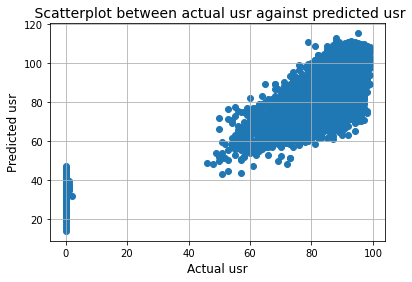

In [257]:
#Scatterplot between actual 'usr' against predicted 'usr'
plt.scatter(df_com['usr'],model1_9_pred)
plt.title(' Scatterplot between actual usr against predicted usr',fontsize=14)
plt.xlabel('Actual usr',fontsize=12)
plt.ylabel('Predicted usr',fontsize=12)
plt.grid();

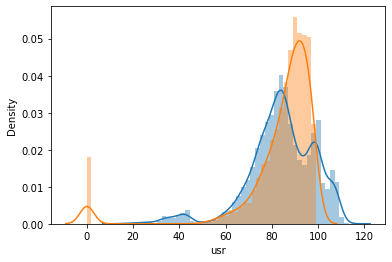

In [190]:
#Graph for actual 'usr' and predicted 'usr'
sns.distplot(model1_9.fittedvalues)
sns.distplot(df_com['usr']);

<AxesSubplot:>

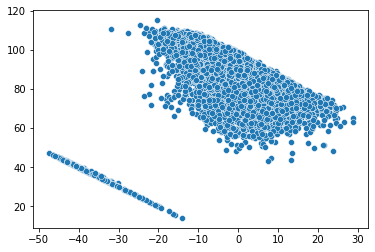

In [193]:
#Linear Relationship b/w Dependent and Independent Varaibles 
# scatterplot for residual
sns.scatterplot(model1_9.resid,model1_9.fittedvalues)

<AxesSubplot:title={'center':'Boxplot of the residuals'}>

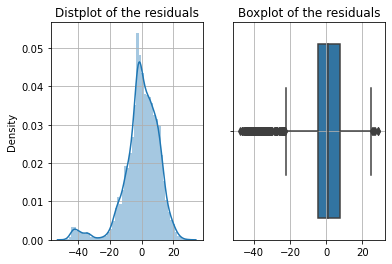

In [194]:
f,a =  plt.subplots(1,2,sharex=False,sharey=False,squeeze=False)


plot_0 = sns.distplot(model1_9.resid,ax=a[0][0])
a[0][0].set_title('Distplot of the residuals')
a[0][0].grid()

plot_1 = sns.boxplot(model1_9.resid,orient='v',ax=a[0][1])
a[0][1].set_title('Boxplot of the residuals')
a[0][1].grid();
plot_1

## CONCLUSION 

#### Sales=( 2.85) + (CompPrice x 0.0923) + (Income x 0.0162) + (Advertising x 0.1164) - (Price x 0.0952) - (Age x 0.0469) + (ShelveLoc x 2.4031)

# Only for Predictive purposes of Linear Regression

If we only wanted to predict using Linear Regression and was not looking for the model building aspect of it, we can do that as well.

First we will split the data into train and test. We will build the model on the training data and check the RMSE on the test data.

###### Note: We are going to build all the models and use those predict first and then go on to evaluate those models.

In [195]:
from sklearn.linear_model import LinearRegression

In [196]:
lr = LinearRegression()

In [197]:
df_com.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,pgscan,atch,pgin,ppgin,pflt,vflt,runqsz,freemem,freeswap,usr
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,0.0,1.6,2.6,16.00,26.40,1,4670,1730946,95
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,0.0,15.63,16.83,0,7278,1869002,97
2,15,3,2162,159,119,2.0,2.4,125473.5,31950.0,0.0,...,0.0,1.2,6.0,9.4,150.20,220.20,0,702,1021237,87
3,0,0,160,12,16,0.2,0.2,125473.5,8670.0,0.0,...,0.0,0.0,0.2,0.2,15.60,16.80,0,7248,1863704,98
4,5,1,330,39,38,0.4,0.4,125473.5,12185.0,0.0,...,0.0,0.0,1.0,1.2,37.80,47.60,0,633,1760253,90


Splitting the data into the dependent and independent variables.

In [198]:
X = df_com[['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap']].copy()
Y = df_com['usr']

Splitting the data into train (70%) and test (30%)

In [199]:
from sklearn.model_selection import train_test_split

In [200]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=0.3,random_state=1)

### Using only Model 9 variables to build the model on the training data and predict on the training as well as test data.

## Base Model building using sklearn Linear Regression

In [235]:
model_base = lr.fit(X_train[['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap']],Y_train)

In [236]:
#Training Data Prediction

model_base_train = model_base.predict(X_train[['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap']])

In [203]:
#Test Data Prediction

model_base_test = model_base.predict(X_test[['lread', 'lwrite', 'scall', 'sread', 'swrite', 'fork', 'exec', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'atch', 'pgin', 'ppgin',
       'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap']])

#### Get the score on training set

In [237]:
print('The coefficient of determination R^2 of the prediction on Train set',model_base.score(X_train, Y_train))

The coefficient of determination R^2 of the prediction on Train set 0.6428396267060905


#### Get the score on test set

In [239]:
print('The coefficient of determination R^2 of the prediction on Test set',model_base.score(X_test, Y_test))

The coefficient of determination R^2 of the prediction on Test set 0.6312171006119699


In [204]:
from sklearn.metrics import mean_squared_error

In [227]:
RMSE_Train_base = np.round(np.sqrt(mean_squared_error(Y_train,model_base_train)),2)
RMSE_Test_base = np.round(np.sqrt(mean_squared_error(Y_test,model_base_test)),2)


print('Training Data RMSE of model_base:',RMSE_Train_base )
print('Test Data RMSE of model_base:',RMSE_Test_base)

Training Data RMSE of model_base: 10.81
Test Data RMSE of model_base: 11.59


In [206]:
resultDf_trn = pd.DataFrame({'RMSE Training Data':[RMSE_Train_base],'RMSE Test Data':[RMSE_Test_base]},index=['Base Model'])
resultDf_trn

,RMSE Training Data,RMSE Test Data
Base Model,10.81,11.59


## Best Model (Model1_9)building using sklearn Linear Regression

In [208]:
model_best = lr.fit(X_train[['lread','lwrite', 'scall','swrite','exec', 'rchar',
       'wchar','pgout', 'pgin', 'pflt', 'runqsz', 'freemem', 'freeswap']],Y_train)

In [ ]:
lread+lwrite+scall+swrite+exec+rchar+wchar+pgout+pgin+pflt+runqsz+freemem+freeswap'

In [210]:
#Training Data Prediction

model_best_train = model_best.predict(X_train[['lread','lwrite', 'scall','swrite','exec', 'rchar',
       'wchar','pgout', 'pgin', 'pflt', 'runqsz', 'freemem', 'freeswap']])

In [211]:
#Test Data Prediction

model_best_test = model_best.predict(X_test[['lread','lwrite', 'scall','swrite','exec', 'rchar',
       'wchar','pgout', 'pgin', 'pflt', 'runqsz', 'freemem', 'freeswap']])

#### Get the score on training set

In [243]:
print('The coefficient of determination R^2 of the prediction on Train set',model_best.score(X_train, Y_train))

The coefficient of determination R^2 of the prediction on Train set 0.6428396267060905


#### Get the score on test set

In [244]:
print('The coefficient of determination R^2 of the prediction on Test set',model_best.score(X_test, Y_test))

The coefficient of determination R^2 of the prediction on Test set 0.6312171006119699


In [212]:
from sklearn.metrics import mean_squared_error

In [213]:
RMSE_Train_best = np.round(np.sqrt(mean_squared_error(Y_train,model_best_train)),2)
RMSE_Test_best = np.round(np.sqrt(mean_squared_error(Y_test,model_best_test)),2)


print('Training Data RMSE of model_best:',RMSE_Train_best)
print('Test Data RMSE of model_best:',RMSE_Test_best)

Training Data RMSE of model_best: 10.9
Test Data RMSE of model_best: 11.68


In [214]:
resultDf_tst = pd.DataFrame({'RMSE Training Data':[RMSE_Train_best],'RMSE Test Data':[RMSE_Test_best]},index=['Best Model'])
resultDf_tst

,RMSE Training Data,RMSE Test Data
Best Model,10.9,11.68


In [215]:
resultDf = pd.concat([resultDf_trn, resultDf_tst])
resultDf

,RMSE Training Data,RMSE Test Data
Base Model,10.81,11.59
Best Model,10.90,11.68


## RMSE check for all the model built

In [228]:
from sklearn.metrics import mean_squared_error

In [230]:
print('Training Data RMSE of model1_9:',mean_squared_error(Y_train,model_best_train,squared=False))
print('Test Data RMSE of model1_9:',mean_squared_error(Y_test,model_best_test,squared=False))

Training Data RMSE of model1_9: 10.898643690924867
Test Data RMSE of model1_9: 11.68002188474293


## Scatteplot for the predictions

<AxesSubplot:xlabel='usr'>

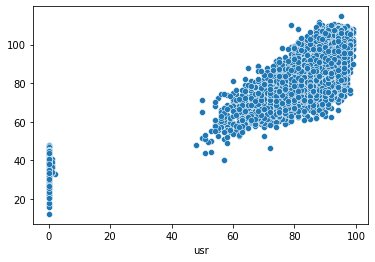

In [245]:
# Training Data
sns.scatterplot(Y_train,model_best_train)

<AxesSubplot:xlabel='usr'>

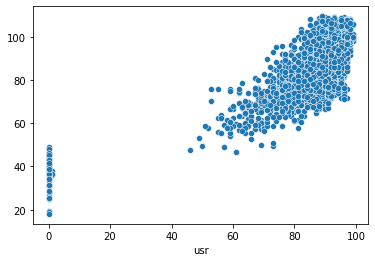

In [246]:
sns.scatterplot(Y_test,model_best_test)

## Checking the linear regression with the same dataset with outlier treatment

<AxesSubplot:>

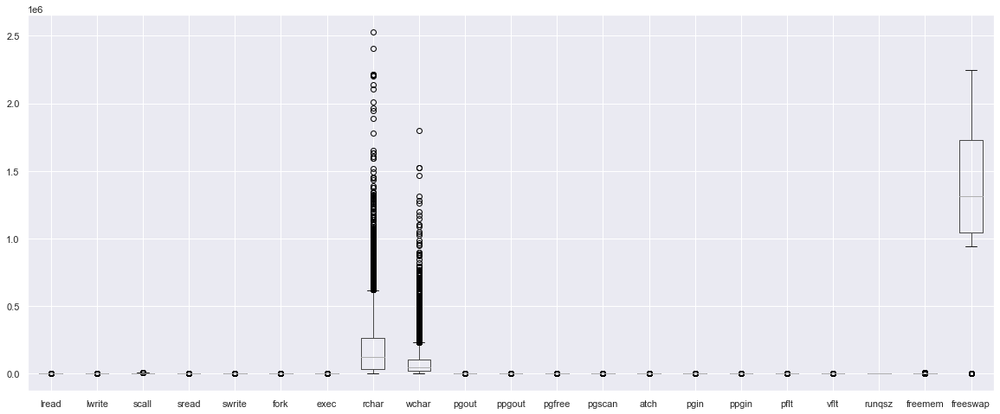

In [580]:
plt.figure(figsize=(20,8))
X_train.boxplot()

In [590]:
X_train_copy=X_train.copy()

In [ ]:
These outliers value needs to be teated and there are several ways of treating them:

Drop the outlier value
Replace the outlier value using the IQR

In [591]:
def remove_outlier(col):
     sorted(col)
     Q1,Q3=np.percentile(col,[25,75])
     IQR=Q3-Q1
     lower_range= Q1-(1.5 * IQR)
     upper_range= Q3+(1.5 * IQR)
     return lower_range, upper_range 

In [592]:
for column in X_train_copy.columns:
     if X_train_copy[column].dtype != 'object': 
         lr,ur=remove_outlier(X_train_copy[column])
         X_train_copy[column]=np.where(X_train_copy[column]>ur,ur,X_train_copy[column])
         X_train_copy[column]=np.where(X_train_copy[column]<lr,lr,X_train_copy[column])

<AxesSubplot:>

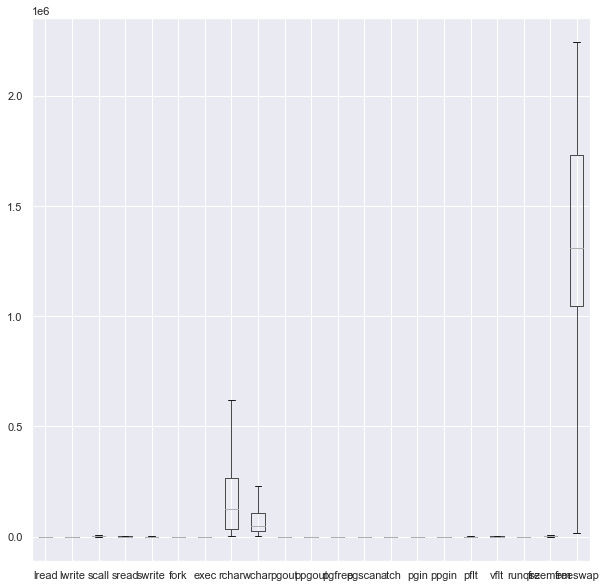

In [593]:
X_train_copy.boxplot()

In [599]:
model1_6_new = lr.fit(X_train_copy[['lread', 'scall', 'fork', 'rchar',
                                   'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'pgin', 'ppgin',
                                   'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap']],Y_train)

In [600]:
#Training Data Prediction

model1_6_new_pred_train = model1_6_new.predict(X_train_copy[['lread', 'scall', 'fork', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'pgin', 'ppgin',
       'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap']])

In [601]:
#Test Data Prediction

model1_6_new_pred_test = model1_6_new.predict(X_train_copy[['lread', 'scall', 'fork', 'rchar',
       'wchar', 'pgout', 'ppgout', 'pgfree', 'pgscan', 'pgin', 'ppgin',
       'pflt', 'vflt', 'runqsz', 'freemem', 'freeswap']])

### 1.4 Inference: Basis on these predictions, what are the business insights and recommendations

In [ ]:
Refer Business report 

# Problem 2-Logistic regression

Problem 2: Logistic Regression

You are a statistician at the Republic of Indonesia Ministry of Health and you are provided with a data of 1473 females collected from a Contraceptive Prevalence Survey. The samples are married women who were either not pregnant or do not know if they were at the time of the survey.

The problem is to predict do/don't they use a contraceptive method of choice based on their demographic and socio-economic characteristics.

Data Dictionary:

1. Wife's age (numerical)
2. Wife's education (categorical) 1=uneducated, 2, 3, 4=tertiary
3. Husband's education (categorical) 1=uneducated, 2, 3, 4=tertiary
4. Number of children ever born (numerical)
5. Wife's religion (binary) Non-Scientology, Scientology
6. Wife's now working? (binary) Yes, No
7. Husband's occupation (categorical) 1, 2, 3, 4(random)
8. Standard-of-living index (categorical) 1=verlow, 2, 3, 4=high
9. Media exposure (binary) Good, Not good
10. Contraceptive method used (class attribute) No,Yes

In [263]:
df_indo=pd.read_excel('Contraceptive_method_dataset.xlsx')

In [264]:
df_indo_copy=df_indo.copy()

### 2.1 Data Ingestion: Read the dataset. Do the descriptive statistics and do null value condition check, check for duplicates and outliers and write an inference on it. Perform Univariate and Bivariate Analysis and Multivariate Analysis.

In [614]:
df_indo1.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No


In [615]:
df_indo.tail()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
1468,33.0,Tertiary,Tertiary,NaN,Scientology,Yes,2,Very High,Exposed,Yes
1469,33.0,Tertiary,Tertiary,NaN,Scientology,No,1,Very High,Exposed,Yes
1470,39.0,Secondary,Secondary,NaN,Scientology,Yes,1,Very High,Exposed,Yes
1471,33.0,Secondary,Secondary,NaN,Scientology,Yes,2,Low,Exposed,Yes
1472,17.0,Secondary,Secondary,1.0,Scientology,No,2,Very High,Exposed,Yes


In [616]:
df_indo.shape

(1473, 10)

In [265]:
df_indo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1402 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1452 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


In [618]:
for feature in df_indo.columns: 
    if df_indo[feature].dtype == 'object': 
        print(feature)
        print(df_indo[feature].value_counts())
        print('\n')

Wife_ education
Tertiary      577
Secondary     410
Primary       334
Uneducated    152
Name: Wife_ education, dtype: int64


Husband_education
Tertiary      899
Secondary     352
Primary       178
Uneducated     44
Name: Husband_education, dtype: int64


Wife_religion
Scientology        1253
Non-Scientology     220
Name: Wife_religion, dtype: int64


Wife_Working
No     1104
Yes     369
Name: Wife_Working, dtype: int64


Standard_of_living_index
Very High    684
High         431
Low          229
Very Low     129
Name: Standard_of_living_index, dtype: int64


Media_exposure 
Exposed        1364
Not-Exposed     109
Name: Media_exposure , dtype: int64


Contraceptive_method_used
Yes    844
No     629
Name: Contraceptive_method_used, dtype: int64




In [619]:
df_indo.describe().T

,count,mean,std,min,25%,50%,75%,max
Wife_age,1402.0,32.606277,8.274927,16.0,26.0,32.0,39.0,49.0
No_of_children_born,1452.0,3.254132,2.365212,0.0,1.0,3.0,4.0,16.0
Husband_Occupation,1473.0,2.137814,0.864857,1.0,1.0,2.0,3.0,4.0


In [620]:
df_indo.describe(include='object').T

,count,unique,top,freq
Wife_ education,1473,4,Tertiary,577
Husband_education,1473,4,Tertiary,899
Wife_religion,1473,2,Scientology,1253
Wife_Working,1473,2,No,1104
Standard_of_living_index,1473,4,Very High,684
Media_exposure,1473,2,Exposed,1364
Contraceptive_method_used,1473,2,Yes,844


In [608]:
df_indo.skew()

Wife_age               0.256009
No_of_children_born    1.120175
Husband_Occupation    -0.098918
dtype: float64

In [91]:
df_indo.isnull().sum()

Wife_age                     71
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

In [92]:
df_indo.duplicated().sum()

80

We are not removing duplicate values because it is possible that samples may have similar records with women of similar ages.

In [95]:
df_indo.rename(columns={"Wife_ education": "Wife_education"},inplace=True)

#### We can see that we have various missing values in 'Wife_age' and 'No_of_children_born' columns. There are various ways of treating your missing values in the data set. And which technique to use when is actually dependent on the type of data you are dealing with.
#### let us go ahead and check if these columns have extreme/outliers values.

<AxesSubplot:xlabel='No_of_children_born'>

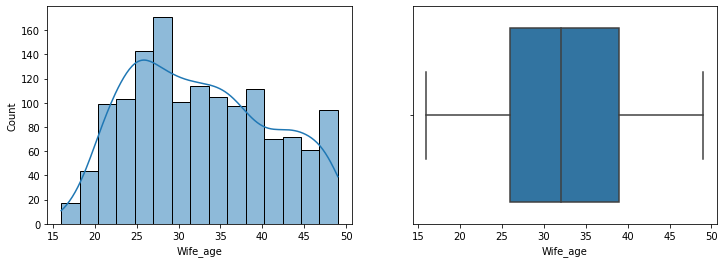

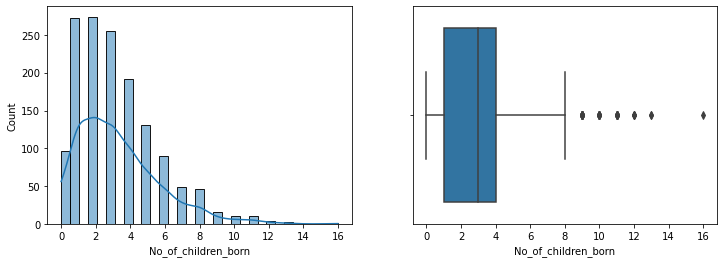

In [96]:
fig,axes= plt.subplots(nrows=1, ncols=2, figsize=(12,4))
sns.histplot(x='Wife_age', data=df_indo, ax=axes[0],kde=True)
sns.boxplot(x='Wife_age', data=df_indo, ax=axes[1])
fig,axes= plt.subplots(nrows=1, ncols=2, figsize=(12,4))
sns.histplot(x='No_of_children_born', data=df_indo, ax=axes[0],kde=True)
sns.boxplot(x='No_of_children_born', data=df_indo, ax=axes[1])

In [97]:
df_indo[df_indo['Wife_age'].isnull()]

,Wife_age,Wife_education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
1380,NaN,Uneducated,Primary,4.0,Scientology,No,3,High,Exposed,Yes
1381,NaN,Uneducated,Primary,4.0,Scientology,No,3,Very Low,Not-Exposed,Yes
1382,NaN,Primary,Primary,7.0,Scientology,Yes,2,Low,Not-Exposed,Yes
1383,NaN,Secondary,Tertiary,2.0,Scientology,Yes,2,Very High,Exposed,Yes
1384,NaN,Tertiary,Tertiary,3.0,Scientology,No,1,Very High,Exposed,Yes
...,...,...,...,...,...,...,...,...,...,...
1446,NaN,Primary,Secondary,3.0,Non-Scientology,Yes,2,Very High,Exposed,Yes
1447,NaN,Tertiary,Tertiary,2.0,Non-Scientology,Yes,2,Very High,Exposed,Yes
1448,NaN,Primary,Secondary,5.0,Scientology,No,3,High,Exposed,Yes
1449,NaN,Tertiary,Tertiary,1.0,Scientology,No,2,High,Exposed,Yes


In [273]:
df_indo[df_indo['No_of_children_born'].isnull()]

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
1451,37.0,Primary,Tertiary,NaN,Scientology,Yes,2,High,Exposed,Yes
1452,26.0,Secondary,Primary,NaN,Scientology,No,3,Very High,Exposed,Yes
1453,28.0,Uneducated,Secondary,NaN,Scientology,No,3,Very High,Exposed,Yes
1454,31.0,Secondary,Tertiary,NaN,Scientology,No,1,Very High,Exposed,Yes
1455,32.0,Primary,Primary,NaN,Scientology,No,2,High,Exposed,Yes
1456,40.0,Primary,Primary,NaN,Non-Scientology,Yes,2,Very High,Exposed,Yes
1457,27.0,Secondary,Secondary,NaN,Scientology,No,2,Very High,Exposed,Yes
1458,27.0,Primary,Primary,NaN,Scientology,No,2,Low,Not-Exposed,Yes
1459,37.0,Tertiary,Tertiary,NaN,Non-Scientology,Yes,2,Very High,Exposed,Yes
1460,22.0,Tertiary,Secondary,NaN,Scientology,No,2,Low,Exposed,Yes


In this exercise,We will not drop the missing values ,we will replace the numerical columns 'wife_age 'with mean values as it has no outliers.
.we will replace the numerical columns 'No_of_children_born 'with median values as it has outliers.

### Impute with mean and median value 

In [274]:
df_indo['Wife_age'].fillna(df_indo['Wife_age'].mean(), inplace=True)
df_indo['No_of_children_born'].fillna(df_indo['No_of_children_born'].median(), inplace=True)

In [101]:
df_indo.isnull().sum()

Wife_age                     0
Wife_education               0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64

In [275]:
df_indo.describe().T

,count,mean,std,min,25%,50%,75%,max
Wife_age,1473.0,32.606277,8.072896,16.0,26.0,32.0,38.0,49.0
No_of_children_born,1473.0,3.250509,2.348473,0.0,1.0,3.0,4.0,16.0
Husband_Occupation,1473.0,2.137814,0.864857,1.0,1.0,2.0,3.0,4.0


In [103]:
df_indo.describe(include='object').T

,count,unique,top,freq
Wife_education,1473,4,Tertiary,577
Husband_education,1473,4,Tertiary,899
Wife_religion,1473,2,Scientology,1253
Wife_Working,1473,2,No,1104
Standard_of_living_index,1473,4,Very High,684
Media_exposure,1473,2,Exposed,1364
Contraceptive_method_used,1473,2,Yes,844


In [104]:
df_indo.skew()

Wife_age               0.256009
No_of_children_born    1.120175
Husband_Occupation    -0.098918
dtype: float64

In [276]:
df_indo.Contraceptive_method_used.value_counts()

Yes    844
No     629
Name: Contraceptive_method_used, dtype: int64

## EDA
## Univariate Analysis

#### All the numerical variables from data set

Text(0.5, 1.0, 'Husband_Occupation')

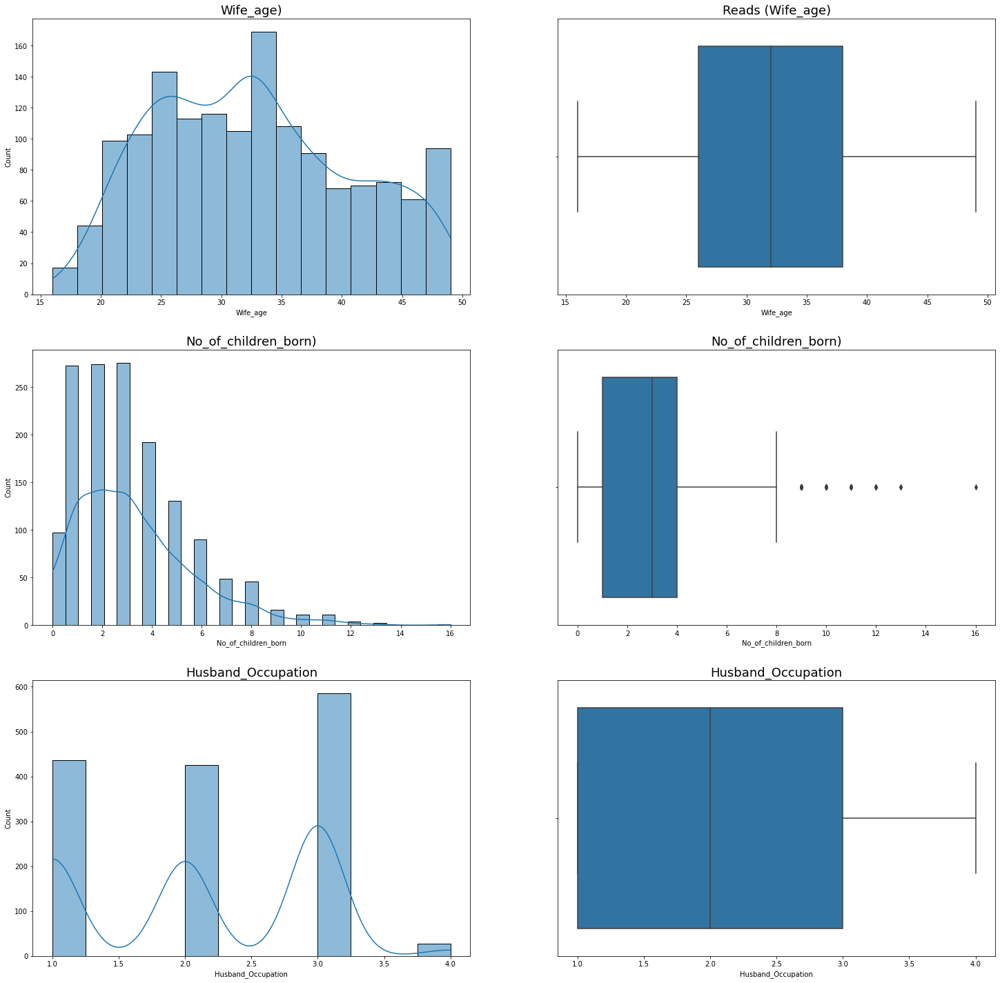

In [106]:
fig,axes= plt.subplots(nrows=3, ncols=2, figsize=(25,25))
a = sns.histplot(x='Wife_age', data=df_indo, ax=axes[0,0] , kde = True)
a.set_title("Wife_age)",fontsize=18)
a = sns.boxplot(x='Wife_age', data=df_indo, ax=axes[0,1])
a.set_title("Reads (Wife_age)",fontsize=18)

a = sns.histplot(x='No_of_children_born', data=df_indo, ax=axes[1,0] , kde = True)
a.set_title("No_of_children_born)",fontsize=18)
a = sns.boxplot(x='No_of_children_born', data=df_indo, ax=axes[1,1])
a.set_title("No_of_children_born)",fontsize=18)

a = sns.histplot(x='Husband_Occupation', data=df_indo, ax=axes[2,0] , kde = True)
a.set_title("Husband_Occupation",fontsize=18)
a = sns.boxplot(x='Husband_Occupation', data=df_indo, ax=axes[2,1])
a.set_title("Husband_Occupation",fontsize=18)

#### All the categorical variables from the dataset

In [107]:
df_indo.columns

Index(['Wife_age', 'Wife_education', 'Husband_education',
       'No_of_children_born', 'Wife_religion', 'Wife_Working',
       'Husband_Occupation', 'Standard_of_living_index', 'Media_exposure ',
       'Contraceptive_method_used'],
      dtype='object')

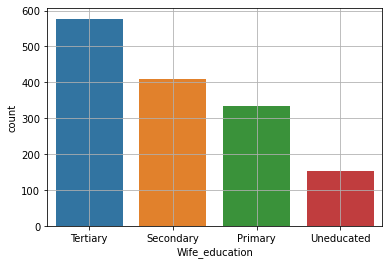

In [109]:
sns.countplot(x='Wife_education', order=df_indo['Wife_education'].value_counts().index, data=df_indo)
plt.grid()
plt.show()

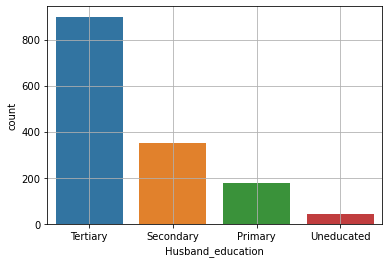

In [110]:
sns.countplot(x='Husband_education', order=df_indo['Husband_education'].value_counts().index, data=df_indo)
plt.grid()
plt.show()

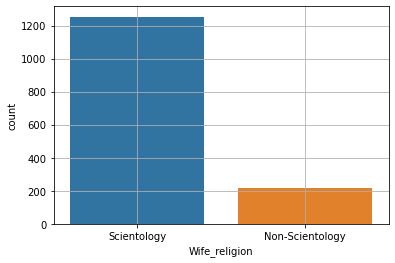

In [111]:
sns.countplot(x='Wife_religion', order=df_indo['Wife_religion'].value_counts().index, data=df_indo)
plt.grid()
plt.show()

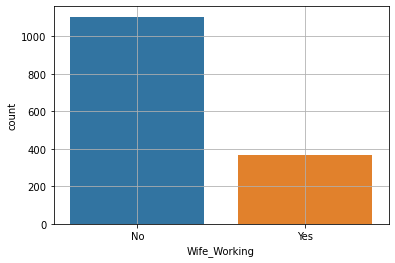

In [112]:
sns.countplot(x='Wife_Working', order=df_indo['Wife_Working'].value_counts().index, data=df_indo)
plt.grid()
plt.show()

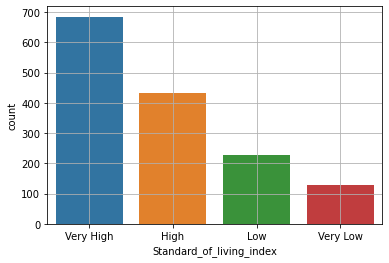

In [113]:
sns.countplot(x='Standard_of_living_index', order=df_indo['Standard_of_living_index'].value_counts().index, data=df_indo)
plt.grid()
plt.show()

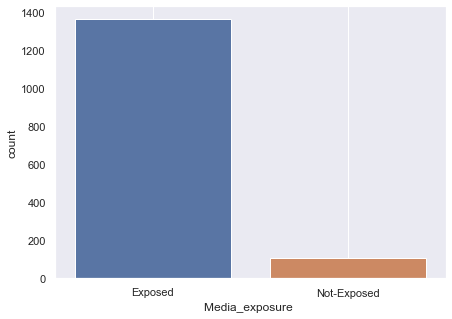

In [484]:
plt.figure (figsize = (7,5))
sns.countplot(x='Media_exposure ', order=df_indo['Media_exposure '].value_counts().index,data=df_indo)
plt.grid()
plt.show()

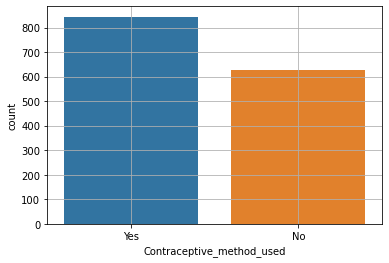

In [115]:
sns.countplot(x='Contraceptive_method_used', order=df_indo['Contraceptive_method_used'].value_counts().index, data=df_indo)
plt.grid()
plt.show()

In [116]:
df_indo.columns

Index(['Wife_age', 'Wife_education', 'Husband_education',
       'No_of_children_born', 'Wife_religion', 'Wife_Working',
       'Husband_Occupation', 'Standard_of_living_index', 'Media_exposure ',
       'Contraceptive_method_used'],
      dtype='object')

## Bivariate Analysis

<AxesSubplot:xlabel='Wife_age', ylabel='count'>

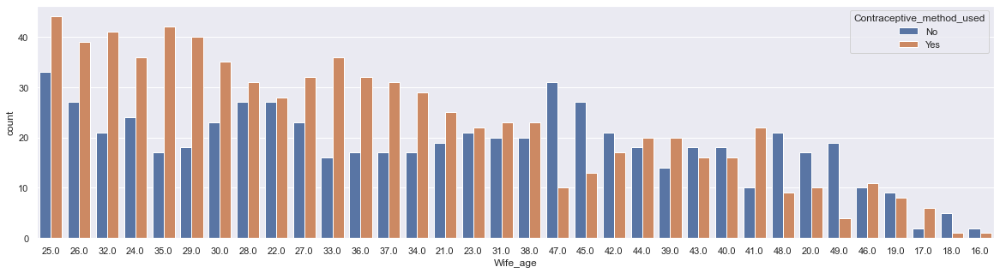

In [621]:
plt.figure (figsize = (20,5))
sns.countplot(x='Wife_age', order=df_indo['Wife_age'].value_counts().index, data=df_indo,hue='Contraceptive_method_used')

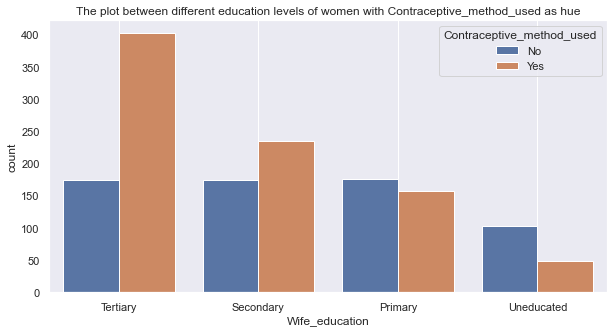

In [486]:
plt.figure (figsize = (10,5))
sns.countplot(x='Wife_education', order=df_indo['Wife_education'].value_counts().index, data=df_indo,hue='Contraceptive_method_used')
plt.title ('The plot between different education levels of women with Contraceptive_method_used as hue')
plt.grid()
plt.show()

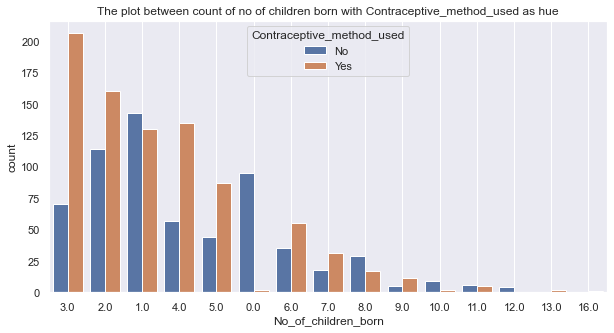

In [487]:
plt.figure (figsize = (10,5))
sns.countplot(x='No_of_children_born', order=df_indo['No_of_children_born'].value_counts().index, data=df_indo,hue='Contraceptive_method_used')
plt.title ('The plot between count of no of children born with Contraceptive_method_used as hue')
plt.grid()
plt.show()

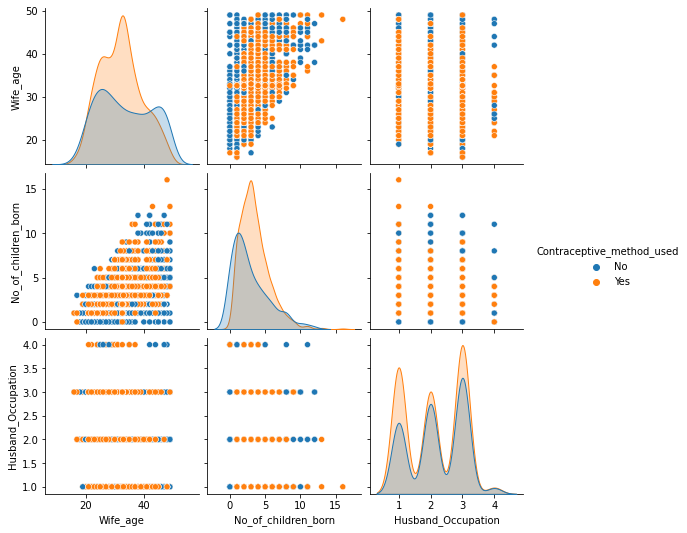

In [121]:
# Pairplot using sns
sns.pairplot(df_indo ,diag_kind='kde' ,hue='Contraceptive_method_used');

<AxesSubplot:>

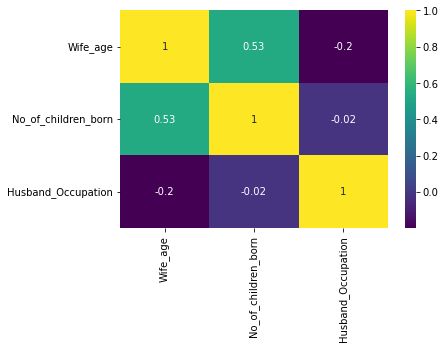

In [122]:
### Correlation heatmap
cor = df_indo.corr()
sns.heatmap(cor, annot=True,cmap='viridis')

### Multivariate Analysis

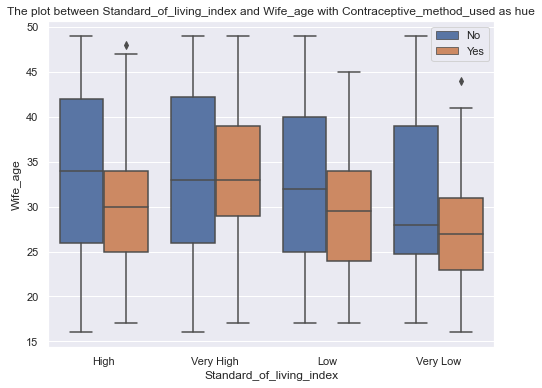

In [490]:
plt.figure(figsize=(8,6))
sns.boxplot(y='Wife_age', x ='Standard_of_living_index', data=df_indo,hue='Contraceptive_method_used')
plt.title ('The plot between Standard_of_living_index and  with Contraceptive_method_used as hue')
plt.legend(loc = 'upper right');

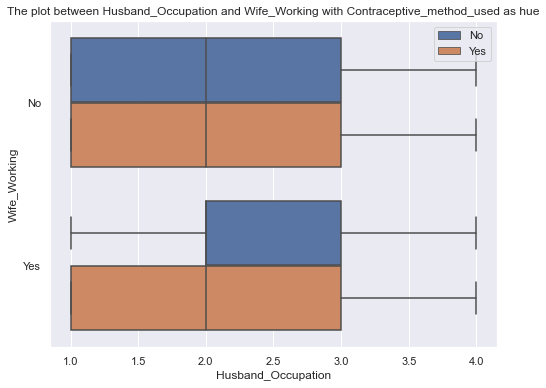

In [491]:
plt.figure(figsize=(8,6))
sns.boxplot(y='Wife_Working', x ='Husband_Occupation', data=df_indo,hue='Contraceptive_method_used')
plt.title ('The plot between Husband_Occupation and Wife_Working with Contraceptive_method_used as hue')
plt.legend(loc = 'upper right');

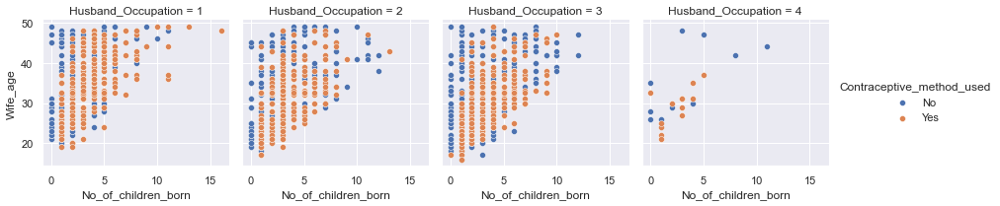

In [494]:
g = sns.FacetGrid(df_indo, col="Husband_Occupation", hue='Contraceptive_method_used', col_wrap=4,margin_titles=True)
g.map_dataframe(sns.scatterplot, x='No_of_children_born', y="Wife_age")
g.fig.subplots_adjust(top=0.9)
g.add_legend()

In [282]:
df_indo.columns

Index(['Wife_age', 'Wife_ education', 'Husband_education',
       'No_of_children_born', 'Wife_religion', 'Wife_Working',
       'Husband_Occupation', 'Standard_of_living_index', 'Media_exposure ',
       'Contraceptive_method_used'],
      dtype='object')

In [281]:
df_indo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1473 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1473 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


In [283]:
# Rename the column names with space characters
df_indo.rename(columns={'Wife_ education':'Wife_education'}, inplace=True)

### 2.2 Do not scale the data. Encode the data (having string values) for Modelling. Data Split: Split the data into train and test (70:30). Apply Logistic Regression and build multiple models with different predictors.

#### Treating the object variables appropriately by either creating dummy variables (One-Hot Encoding) or coding it up in an ordinal manner.


In [284]:
df_indo.head()

,Wife_age,Wife_education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,Primary,Secondary,3.0,Scientology,No,2,High,Exposed,No
1,45.0,Uneducated,Secondary,10.0,Scientology,No,3,Very High,Exposed,No
2,43.0,Primary,Secondary,7.0,Scientology,No,3,Very High,Exposed,No
3,42.0,Secondary,Primary,9.0,Scientology,No,3,High,Exposed,No
4,36.0,Secondary,Secondary,8.0,Scientology,No,3,Low,Exposed,No


In [266]:
for feature in df_indo.columns: 
    if df_indo[feature].dtype == 'object': 
        print(feature)
        print(df_indo[feature].value_counts())
        print('\n')

Wife_ education
Tertiary      577
Secondary     410
Primary       334
Uneducated    152
Name: Wife_ education, dtype: int64


Husband_education
Tertiary      899
Secondary     352
Primary       178
Uneducated     44
Name: Husband_education, dtype: int64


Wife_religion
Scientology        1253
Non-Scientology     220
Name: Wife_religion, dtype: int64


Wife_Working
No     1104
Yes     369
Name: Wife_Working, dtype: int64


Standard_of_living_index
Very High    684
High         431
Low          229
Very Low     129
Name: Standard_of_living_index, dtype: int64


Media_exposure 
Exposed        1364
Not-Exposed     109
Name: Media_exposure , dtype: int64


Contraceptive_method_used
Yes    844
No     629
Name: Contraceptive_method_used, dtype: int64




In [285]:
df_indo_encoding=df_indo.copy()
df_indo_encoding['Contraceptive_method_used'] = pd.Categorical(df_indo_encoding['Contraceptive_method_used']).codes 

In [286]:
df_indo_encoding.tail()

,Wife_age,Wife_education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
1468,33.0,Tertiary,Tertiary,3.0,Scientology,Yes,2,Very High,Exposed,1
1469,33.0,Tertiary,Tertiary,3.0,Scientology,No,1,Very High,Exposed,1
1470,39.0,Secondary,Secondary,3.0,Scientology,Yes,1,Very High,Exposed,1
1471,33.0,Secondary,Secondary,3.0,Scientology,Yes,2,Low,Exposed,1
1472,17.0,Secondary,Secondary,1.0,Scientology,No,2,Very High,Exposed,1


In [287]:
## We are coding up the 'Wife_education' variable in an ordinal manner

df_indo_encoding['Wife_education']=np.where(df_indo_encoding['Wife_education'] =='Uneducated', '1', df_indo_encoding['Wife_education'])
df_indo_encoding['Wife_education']=np.where(df_indo_encoding['Wife_education'] =='Primary', '2', df_indo_encoding['Wife_education'])
df_indo_encoding['Wife_education']=np.where(df_indo_encoding['Wife_education'] =='Secondary', '3', df_indo_encoding['Wife_education'])
df_indo_encoding['Wife_education']=np.where(df_indo_encoding['Wife_education'] =='Tertiary', '3', df_indo_encoding['Wife_education'])

## We are coding up the 'Husband_education' variable in an ordinal manner

df_indo_encoding['Husband_education']=np.where(df_indo_encoding['Husband_education'] =='Uneducated', '1', df_indo_encoding['Husband_education'])
df_indo_encoding['Husband_education']=np.where(df_indo_encoding['Husband_education'] =='Primary', '2', df_indo_encoding['Husband_education'])
df_indo_encoding['Husband_education']=np.where(df_indo_encoding['Husband_education'] =='Secondary', '3', df_indo_encoding['Husband_education'])
df_indo_encoding['Husband_education']=np.where(df_indo_encoding['Husband_education'] =='Tertiary', '3', df_indo_encoding['Husband_education'])

## We are coding up the 'Standard_of_living_index' variable in an ordinal manner

df_indo_encoding['Standard_of_living_index']=np.where(df_indo_encoding['Standard_of_living_index'] =='Very Low', '1', df_indo_encoding['Standard_of_living_index'])
df_indo_encoding['Standard_of_living_index']=np.where(df_indo_encoding['Standard_of_living_index'] =='Low', '2', df_indo_encoding['Standard_of_living_index'])
df_indo_encoding['Standard_of_living_index']=np.where(df_indo_encoding['Standard_of_living_index'] =='High', '3', df_indo_encoding['Standard_of_living_index'])
df_indo_encoding['Standard_of_living_index']=np.where(df_indo_encoding['Standard_of_living_index'] =='Very High', '3', df_indo_encoding['Standard_of_living_index'])


In [288]:
df_indo_encoding.tail()

,Wife_age,Wife_education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
1468,33.0,3,3,3.0,Scientology,Yes,2,3,Exposed,1
1469,33.0,3,3,3.0,Scientology,No,1,3,Exposed,1
1470,39.0,3,3,3.0,Scientology,Yes,1,3,Exposed,1
1471,33.0,3,3,3.0,Scientology,Yes,2,2,Exposed,1
1472,17.0,3,3,1.0,Scientology,No,2,3,Exposed,1


In [289]:
df_indo_encoding.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1473 non-null   float64
 1   Wife_education             1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1473 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   int8   
dtypes: float64(2), int64(1), int8(1), object(6)
memory usage: 105.1+ KB


In [290]:
## Converting the variable to numeric

df_indo_encoding['Wife_education'] = df_indo_encoding['Wife_education'].astype('int64')
df_indo_encoding['Husband_education'] = df_indo_encoding['Husband_education'].astype('int64')
df_indo_encoding['Standard_of_living_index'] = df_indo_encoding['Standard_of_living_index'].astype('int64')
df_indo_encoding.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1473 non-null   float64
 1   Wife_education             1473 non-null   int64  
 2   Husband_education          1473 non-null   int64  
 3   No_of_children_born        1473 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   int64  
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   int8   
dtypes: float64(2), int64(4), int8(1), object(3)
memory usage: 105.1+ KB


In [291]:
## Converting the other 'object' type variables as dummy variables

df_indo_dummy = pd.get_dummies(df_indo_encoding,drop_first=True)
df_indo_dummy.head()

,Wife_age,Wife_education,Husband_education,No_of_children_born,Husband_Occupation,Standard_of_living_index,Contraceptive_method_used,Wife_religion_Scientology,Wife_Working_Yes,Media_exposure _Not-Exposed
0,24.0,2,3,3.0,2,3,0,1,0,0
1,45.0,1,3,10.0,3,3,0,1,0,0
2,43.0,2,3,7.0,3,3,0,1,0,0
3,42.0,3,2,9.0,3,3,0,1,0,0
4,36.0,3,3,8.0,3,2,0,1,0,0


In [292]:
df_indo_dummy.rename(columns={"Media_exposure _Not-Exposed": "Media_exposure_Not_Exposed","Standard_of_living_index_Very High":"Standard_of_living_index_Very_High","Standard_of_living_index_Very Low":"Standard_of_living_index_Very_Low"},inplace=True)

In [293]:
df_indo_dummy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Wife_age                    1473 non-null   float64
 1   Wife_education              1473 non-null   int64  
 2   Husband_education           1473 non-null   int64  
 3   No_of_children_born         1473 non-null   float64
 4   Husband_Occupation          1473 non-null   int64  
 5   Standard_of_living_index    1473 non-null   int64  
 6   Contraceptive_method_used   1473 non-null   int8   
 7   Wife_religion_Scientology   1473 non-null   uint8  
 8   Wife_Working_Yes            1473 non-null   uint8  
 9   Media_exposure_Not_Exposed  1473 non-null   uint8  
dtypes: float64(2), int64(4), int8(1), uint8(3)
memory usage: 74.9 KB


### Model 1 - Build the Logistic Regression Model using all the variables on the full data and check the summary statistics of the model. Check for multicollinearity in the predictor variables using Variance Inflation Factor

In [294]:
import statsmodels.formula.api as sm

In [295]:
df_indo_dummy.columns

Index(['Wife_age', 'Wife_education', 'Husband_education',
       'No_of_children_born', 'Husband_Occupation', 'Standard_of_living_index',
       'Contraceptive_method_used', 'Wife_religion_Scientology',
       'Wife_Working_Yes', 'Media_exposure_Not_Exposed'],
      dtype='object')

Backward Elimination
In the above steps, we added columns to model.

Now let's build model by starting with all columns and then drop columns as needed

In [297]:
formula_1='Contraceptive_method_used~Wife_age+No_of_children_born+Husband_Occupation+Wife_education+Husband_education+Wife_religion_Scientology+Wife_Working_Yes+Standard_of_living_index+++Media_exposure_Not_Exposed'

In [298]:
Logistic_1 = sm.logit(formula=formula_1,data=df_indo_dummy).fit()

Optimization terminated successfully.
         Current function value: 0.614133
         Iterations 5


In [299]:
Logistic_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               Logit Regression Results                              
=====================================================================================
Dep. Variable:     Contraceptive_method_used   No. Observations:                 1473
Model:                                 Logit   Df Residuals:                     1463
Method:                                  MLE   Df Model:                            9
Date:                       Mon, 28 Nov 2022   Pseudo R-squ.:                  0.1001
Time:                               21:06:48   Log-Likelihood:                -904.62
converged:                              True   LL-Null:                       -1005.3
Covariance Type:                   nonrobust   LLR p-value:                 1.785e-38
==============================================================================================
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                     -0.9032      0.640     -1.412      0.158      -2.157       0.350
Wife_age                      -0.0696      0.009     -7.542      0.000      -0.088      -0.052
No_of_children_born            0.2975      0.033      9.033      0.000       0.233       0.362
Husband_Occupation            -0.0187      0.072     -0.260      0.794      -0.159       0.122
Wife_education                 0.6088      0.108      5.652      0.000       0.398       0.820
Husband_education              0.1491      0.149      1.000      0.318      -0.143       0.441
Wife_religion_Scientology     -0.4581      0.167     -2.742      0.006      -0.786      -0.131
Wife_Working_Yes              -0.1017      0.131     -0.779      0.436      -0.358       0.154
Standard_of_living_index       0.3828      0.098      3.892      0.000       0.190       0.576
Media_exposure_Not_Exposed    -0.4796      0.249     -1.924      0.054      -0.968       0.009
==============================================================================================
"""

In [ ]:
Let us look at the adjusted pseudo R-square value.

To get the adjusted Mcfadden's $R^2$ value, the following is the formula:

## 1 - $\frac{Log-Likelihood\ -\ Degrees\ of\ Freedom\ of\ the\ Model}{LL-Null}$

In [300]:
print('The adjusted pseudo R-square value is',1 - ((Logistic_1.llf - Logistic_1.df_model)/Logistic_1.llnull))

The adjusted pseudo R-square value is 0.09116090087300444


We will keep watch on adjusted pseudo R-square as we drop variables in the following iterations

Let's check multicollinearity using Variance Inflation Factor (VIF) for the predictor variables.

### Check for multicollinearity in the predictor variables using Variance Inflation Factor (VIF).

In [301]:
def vif_cal(input_data):
    x_vars=input_data
    xvar_names=input_data.columns
    for i in range(0,xvar_names.shape[0]):
        y=x_vars[xvar_names[i]] 
        x=x_vars[xvar_names.drop(xvar_names[i])]
        rsq=sm.ols(formula="y~x", data=x_vars).fit().rsquared  
        vif=round(1/(1-rsq),2)
        print (xvar_names[i], " VIF = " , vif)

In [302]:
vif_cal(input_data=df_indo_dummy.drop('Contraceptive_method_used',axis=1))

Wife_age  VIF =  1.59
Wife_education  VIF =  1.58
Husband_education  VIF =  1.39
No_of_children_born  VIF =  1.49
Husband_Occupation  VIF =  1.2
Standard_of_living_index  VIF =  1.21
Wife_religion_Scientology  VIF =  1.1
Wife_Working_Yes  VIF =  1.03
Media_exposure_Not_Exposed  VIF =  1.22


### Threshold value considered is VIF < 2,VIF indicates there is no Multicollinearity problem.

#### Here, we see that the value of VIF for all the variables are less than 2, which is within the thresold .The p-values tell us that the 'Husband_Occupation','Wife_Working_Yes','Husband_education','Media_exposure_Not_Exposed' variable is less significant than the other variables. we will drop the variables one by one as per P value. 
### We will drop the variable due to significance and not because of Multicollinearity.

### Droping the variable 'Husband_Occupation ' which has the highest P Value . Build a second iteration of the model on the full data. Check the the adjusted pseudo R-square value for the new model.

### Model-2

#### Note : Threshold value considered is VIF < 2 

In [303]:
formula_2='Contraceptive_method_used~Wife_age+No_of_children_born+Wife_education+Husband_education+Wife_religion_Scientology+Wife_Working_Yes+Standard_of_living_index+++Media_exposure_Not_Exposed'

In [304]:
Logistic_2 = sm.logit(formula=formula_2,data=df_indo_dummy).fit()

Optimization terminated successfully.
         Current function value: 0.614156
         Iterations 5


In [305]:
Logistic_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               Logit Regression Results                              
=====================================================================================
Dep. Variable:     Contraceptive_method_used   No. Observations:                 1473
Model:                                 Logit   Df Residuals:                     1464
Method:                                  MLE   Df Model:                            8
Date:                       Mon, 28 Nov 2022   Pseudo R-squ.:                  0.1001
Time:                               21:16:15   Log-Likelihood:                -904.65
converged:                              True   LL-Null:                       -1005.3
Covariance Type:                   nonrobust   LLR p-value:                 3.548e-39
==============================================================================================
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                     -0.9923      0.540     -1.836      0.066      -2.051       0.067
Wife_age                      -0.0691      0.009     -7.653      0.000      -0.087      -0.051
No_of_children_born            0.2971      0.033      9.030      0.000       0.233       0.362
Wife_education                 0.6151      0.105      5.861      0.000       0.409       0.821
Husband_education              0.1516      0.149      1.019      0.308      -0.140       0.443
Wife_religion_Scientology     -0.4561      0.167     -2.734      0.006      -0.783      -0.129
Wife_Working_Yes              -0.1021      0.131     -0.782      0.434      -0.358       0.154
Standard_of_living_index       0.3863      0.097      3.963      0.000       0.195       0.577
Media_exposure_Not_Exposed    -0.4790      0.249     -1.922      0.055      -0.967       0.009
==============================================================================================
"""

In [306]:
#Let us look at the adjusted pseudo R-square value.
print('The adjusted pseudo R-square value is',1 - ((Logistic_2.llf - Logistic_2.df_model)/Logistic_2.llnull))

The adjusted pseudo R-square value is 0.0921219264541947


We see that the adjusted pseudo R-square value of the model has increased. thus we conclude that the variable was not significant.We have dropped a variable due to significance (and not because of Multicollinearity)

### Droping the variable 'Wife_Working_Yes ' which has the highest p-value>0.05 (least significant variable). Build a second iteration of the model on the full data. Check the the adjusted pseudo R-square value for the new model.

### Model-3

In [307]:
formula_3='Contraceptive_method_used~Wife_age+No_of_children_born+Wife_education+Husband_education+Wife_religion_Scientology+Standard_of_living_index+++Media_exposure_Not_Exposed'

In [308]:
Logistic_3 = sm.logit(formula=formula_3,data=df_indo_dummy).fit()

Optimization terminated successfully.
         Current function value: 0.614363
         Iterations 5


In [309]:
Logistic_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               Logit Regression Results                              
=====================================================================================
Dep. Variable:     Contraceptive_method_used   No. Observations:                 1473
Model:                                 Logit   Df Residuals:                     1465
Method:                                  MLE   Df Model:                            7
Date:                       Mon, 28 Nov 2022   Pseudo R-squ.:                 0.09978
Time:                               21:24:38   Log-Likelihood:                -904.96
converged:                              True   LL-Null:                       -1005.3
Covariance Type:                   nonrobust   LLR p-value:                 8.554e-40
==============================================================================================
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                     -1.0086      0.540     -1.868      0.062      -2.067       0.050
Wife_age                      -0.0697      0.009     -7.733      0.000      -0.087      -0.052
No_of_children_born            0.3001      0.033      9.175      0.000       0.236       0.364
Wife_education                 0.6134      0.105      5.847      0.000       0.408       0.819
Husband_education              0.1549      0.149      1.041      0.298      -0.137       0.447
Wife_religion_Scientology     -0.4518      0.167     -2.710      0.007      -0.779      -0.125
Standard_of_living_index       0.3824      0.097      3.929      0.000       0.192       0.573
Media_exposure_Not_Exposed    -0.4847      0.249     -1.944      0.052      -0.973       0.004
==============================================================================================
"""

In [310]:
#Let us look at the adjusted pseudo R-square value.
print('The adjusted pseudo R-square value is',1 - ((Logistic_3.llf - Logistic_3.df_model)/Logistic_3.llnull))

The adjusted pseudo R-square value is 0.09281340783543035


We see that the adjusted pseudo R-square value of the model has increased. thus we conclude that the variable was not significant.We have dropped a variable due to significance (and not because of Multicollinearity)

### Droping the variable 'Husband_education' which has the highest p-value>0.05 . Build a second iteration of the model on the full data. Check the the adjusted pseudo R-square value for the new model.

### Model-4

In [312]:
formula_4='Contraceptive_method_used~Wife_age+No_of_children_born+Wife_education+Wife_religion_Scientology+Standard_of_living_index+++Media_exposure_Not_Exposed'

In [313]:
Logistic_4 = sm.logit(formula=formula_4,data=df_indo_dummy).fit()

Optimization terminated successfully.
         Current function value: 0.614732
         Iterations 5


In [314]:
Logistic_4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               Logit Regression Results                              
=====================================================================================
Dep. Variable:     Contraceptive_method_used   No. Observations:                 1473
Model:                                 Logit   Df Residuals:                     1466
Method:                                  MLE   Df Model:                            6
Date:                       Mon, 28 Nov 2022   Pseudo R-squ.:                 0.09924
Time:                               21:41:49   Log-Likelihood:                -905.50
converged:                              True   LL-Null:                       -1005.3
Covariance Type:                   nonrobust   LLR p-value:                 2.405e-40
==============================================================================================
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                     -0.7015      0.451     -1.555      0.120      -1.586       0.183
Wife_age                      -0.0697      0.009     -7.747      0.000      -0.087      -0.052
No_of_children_born            0.2982      0.033      9.147      0.000       0.234       0.362
Wife_education                 0.6551      0.097      6.737      0.000       0.464       0.846
Wife_religion_Scientology     -0.4546      0.167     -2.728      0.006      -0.781      -0.128
Standard_of_living_index       0.3955      0.097      4.097      0.000       0.206       0.585
Media_exposure_Not_Exposed    -0.5113      0.248     -2.063      0.039      -0.997      -0.025
==============================================================================================
"""

In [315]:
#Let us look at the adjusted pseudo R-square value.
print('The adjusted pseudo R-square value is',1 - ((Logistic_4.llf - Logistic_4.df_model)/Logistic_4.llnull))

The adjusted pseudo R-square value is 0.09326778413171644


We see that the adjusted pseudo R-square value of the model has increased. thus we conclude that the variable was not significant.We have dropped a variable due to significance (and not because of Multicollinearity)

#### Now all the P values are less than 0.05 .'p values' indicate that all variables are significant at 95% confidence level

### Prediction on the Data using stats model_4
Now, let us see the predicted probability values.

There are probabilities of an individual going to use contraceptive method

In [382]:
# With stats model now we are predicting our target variables probabilities.
y_prob_pred_4 = Logistic_4.predict()
y_prob_pred_4

array([0.63701557, 0.62978053, 0.6061331 , ..., 0.54291295, 0.54853794,
       0.75192928])

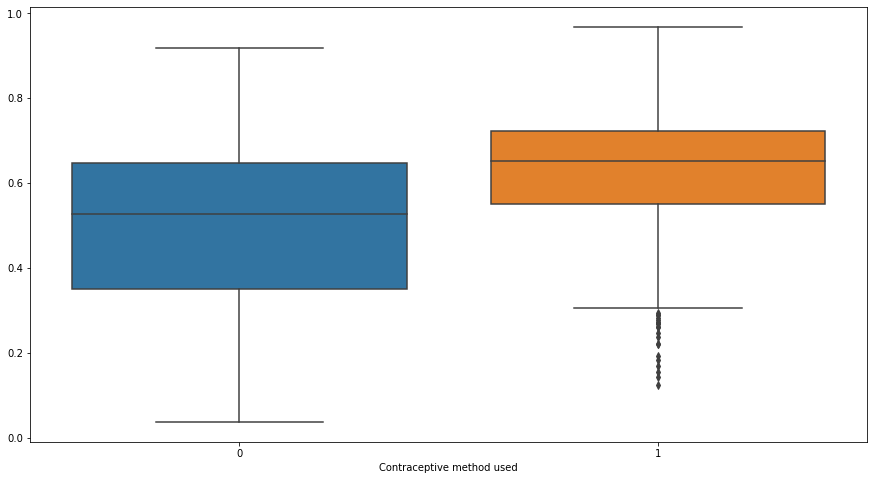

In [383]:
#Let us see the spread of the probability of the contrceptive method used on actual data not on predicted data.
sns.boxplot(x=df_indo_dummy['Contraceptive_method_used'],y=y_prob_pred_4)
plt.xlabel('Contraceptive method used');

From the above boxplot, we need to decide on one such value of a cut-off which will give us the most reasonable power of the model. Let us take a cut-off of 0.5 first and check.

Let us now see the predicted classes

In [384]:
#This is our Y predicted values with cutoff 0.5 ,if its more than 0.5 it will show 1 or else it will show 0
y_class_pred=(y_prob_pred_4>=0.5).astype(int)
y_class_pred

array([1, 1, 1, ..., 1, 1, 1])

In [ ]:
Model Evaluation on the Data

### Split the data into training (70%) and test (30%) in such a way that the uniformity in the training as well as test is maintained every time the code is run. 

In [316]:
from sklearn.model_selection import train_test_split

In [317]:
Train,Test = train_test_split(df_indo_dummy,test_size=0.3,random_state=1,stratify=df_indo_dummy['Contraceptive_method_used'])

In [541]:
Train.shape

(1031, 10)

In [542]:
Test.shape

(442, 10)

In [318]:
Train['Contraceptive_method_used'].value_counts()

1    591
0    440
Name: Contraceptive_method_used, dtype: int64

In [319]:
Test['Contraceptive_method_used'].value_counts()

1    253
0    189
Name: Contraceptive_method_used, dtype: int64

### Building the models 1,2,3 and 4 on the training data and checking the accuracy score of each of the models on the training data and use those models to predict the classes and the corresponding probabilities on the test data.

We are using sklearn library for further analysis

In [321]:
from sklearn.linear_model import LogisticRegression

In [322]:
LR = LogisticRegression(solver='newton-cg',penalty='none')


### Model 1 - Building the model on the Training Data and checking the Accuracy score on the training data.

In [323]:
df_indo_dummy.columns

Index(['Wife_age', 'Wife_education', 'Husband_education',
       'No_of_children_born', 'Husband_Occupation', 'Standard_of_living_index',
       'Contraceptive_method_used', 'Wife_religion_Scientology',
       'Wife_Working_Yes', 'Media_exposure_Not_Exposed'],
      dtype='object')

In [364]:
model_1 = LR.fit(Train[['Wife_age', 'Wife_education', 'Husband_education',
       'No_of_children_born', 'Husband_Occupation', 'Standard_of_living_index',
       'Wife_religion_Scientology','Wife_Working_Yes', 'Media_exposure_Not_Exposed']],Train['Contraceptive_method_used'])

### Model 1 - Predicting the classes and the probabilities on the Train and Test Data

In [366]:
model_1_train_class = model_1.predict(Train[['Wife_age', 'Wife_education', 'Husband_education',
       'No_of_children_born', 'Husband_Occupation', 'Standard_of_living_index',
       'Wife_religion_Scientology','Wife_Working_Yes', 'Media_exposure_Not_Exposed']])

In [326]:
model_1_test_class = model_1.predict(Test[['Wife_age', 'Wife_education', 'Husband_education',
       'No_of_children_born', 'Husband_Occupation', 'Standard_of_living_index',
       'Wife_religion_Scientology','Wife_Working_Yes', 'Media_exposure_Not_Exposed']])

In [327]:
model_1_test_probabilities = model_1.predict_proba(Test[['Wife_age', 'Wife_education', 'Husband_education',
       'No_of_children_born', 'Husband_Occupation', 'Standard_of_living_index',
       'Wife_religion_Scientology','Wife_Working_Yes', 'Media_exposure_Not_Exposed']])

### Model 2 - Building the model on the Training Data and checking the Accuracy score on the training data.
### Drop Variable-'Husband_Occupation'

In [368]:
model_2 = LR.fit(Train[['Wife_age', 'Wife_education', 'Husband_education',
       'No_of_children_born', 'Standard_of_living_index',
       'Wife_religion_Scientology','Wife_Working_Yes', 'Media_exposure_Not_Exposed']],Train['Contraceptive_method_used'])

### Model 2 - Predicting the classes and the probabilities on the Train and Test Data

In [370]:
model_2_train_class = model_2.predict(Train[['Wife_age', 'Wife_education', 'Husband_education',
       'No_of_children_born', 'Standard_of_living_index',
       'Wife_religion_Scientology','Wife_Working_Yes', 'Media_exposure_Not_Exposed']])

In [330]:
model_2_test_class = model_2.predict(Test[['Wife_age', 'Wife_education', 'Husband_education',
       'No_of_children_born', 'Standard_of_living_index',
       'Wife_religion_Scientology','Wife_Working_Yes', 'Media_exposure_Not_Exposed']])

In [331]:
model_2_test_probabilities = model_2.predict_proba(Test[['Wife_age', 'Wife_education', 'Husband_education',
       'No_of_children_born', 'Standard_of_living_index',
       'Wife_religion_Scientology','Wife_Working_Yes', 'Media_exposure_Not_Exposed']])

### Model 3 - Building the model on the Training Data and checking the Accuracy score on the training data.
### Drop Variable-'Wife_Working_Yes'

In [371]:
model_3 = LR.fit(Train[['Wife_age', 'Wife_education', 'Husband_education',
       'No_of_children_born', 'Standard_of_living_index',
       'Wife_religion_Scientology','Media_exposure_Not_Exposed']],Train['Contraceptive_method_used'])

### Model 3 - Predicting the classes and the probabilities on train and the Test Data

In [373]:
model_3_train_class = model_3.predict(Train[['Wife_age', 'Wife_education', 'Husband_education',
       'No_of_children_born', 'Standard_of_living_index',
       'Wife_religion_Scientology','Media_exposure_Not_Exposed']])

In [374]:
model_3_test_class = model_3.predict(Test[['Wife_age', 'Wife_education', 'Husband_education',
       'No_of_children_born', 'Standard_of_living_index',
       'Wife_religion_Scientology','Media_exposure_Not_Exposed']])

In [375]:
model_3_test_probabilities = model_3.predict_proba(Test[['Wife_age', 'Wife_education', 'Husband_education',
       'No_of_children_born', 'Standard_of_living_index',
       'Wife_religion_Scientology','Media_exposure_Not_Exposed']])

### Model 4 - Building the model on the Training Data and checking the Accuracy score on the training data.
### Drop Variable-'Husband_education'

In [376]:
model_4 = LR.fit(Train[['Wife_age', 'Wife_education',
       'No_of_children_born', 'Standard_of_living_index',
       'Wife_religion_Scientology','Media_exposure_Not_Exposed']],Train['Contraceptive_method_used'])

In [377]:
print('Accuracy Score of Model 4:',model_4.score(Train[['Wife_age', 'Wife_education',
       'No_of_children_born', 'Standard_of_living_index',
       'Wife_religion_Scientology','Media_exposure_Not_Exposed']],Train['Contraceptive_method_used']))

Accuracy Score of Model 4: 0.6750727449078564


### Model 4 - Predicting the classes and the probabilities on the Train and Test Data

In [378]:
model_4_train_class = model_4.predict(Train[['Wife_age', 'Wife_education',
       'No_of_children_born', 'Standard_of_living_index',
       'Wife_religion_Scientology','Media_exposure_Not_Exposed']])

In [379]:
model_4_test_class = model_4.predict(Test[['Wife_age', 'Wife_education',
       'No_of_children_born', 'Standard_of_living_index',
       'Wife_religion_Scientology','Media_exposure_Not_Exposed']])

In [351]:
model_4_test_probabilities = model_4.predict_proba(Test[['Wife_age', 'Wife_education',
       'No_of_children_born', 'Standard_of_living_index',
       'Wife_religion_Scientology','Media_exposure_Not_Exposed']])

In [362]:
model_4_test_probabilities = model_4.predict_proba(Test[['Wife_age', 'Wife_education',
       'No_of_children_born', 'Standard_of_living_index',
       'Wife_religion_Scientology','Media_exposure_Not_Exposed']])[:,1]
model_4_test_probabilities 

array([0.80485508, 0.11747397, 0.04194653, 0.58935137, 0.62683491,
       0.68032391, 0.16972261, 0.72924499, 0.41253693, 0.3749907 ,
       0.47231623, 0.54717453, 0.5701825 , 0.71208538, 0.74195854,
       0.75797335, 0.4039132 , 0.7147729 , 0.69261322, 0.56857097,
       0.70938283, 0.68163623, 0.56857097, 0.39196004, 0.75286942,
       0.21673864, 0.6465535 , 0.71219443, 0.40086598, 0.72924499,
       0.91884298, 0.73054078, 0.69995739, 0.67815449, 0.47404595,
       0.66578567, 0.45275702, 0.91108763, 0.39674861, 0.78455405,
       0.4818523 , 0.66138387, 0.84287923, 0.33655253, 0.69707709,
       0.64354374, 0.48337526, 0.71208538, 0.70389855, 0.69500603,
       0.85466188, 0.78229557, 0.47231623, 0.83838329, 0.5472156 ,
       0.42299332, 0.63155934, 0.67734203, 0.7147729 , 0.82282076,
       0.37807663, 0.67272388, 0.72924499, 0.45614796, 0.57340106,
       0.50998782, 0.72664168, 0.62837106, 0.41838413, 0.66432156,
       0.63308742, 0.5472156 , 0.64505005, 0.31698184, 0.50134

### 2.3 Performance Metrics: Check the performance of Predictions on Train and Test sets using Accuracy, Confusion Matrix, Plot ROC curve and get ROC_AUC score for each model Final Model: Compare Both the models and write inference which model is best/optimized.

In [340]:
from sklearn import metrics

#### Confusion Matrix summary statistics Evaluation on the Test Data

In [341]:
from pylab import rcParams
rcParams['figure.figsize'] = 10,10

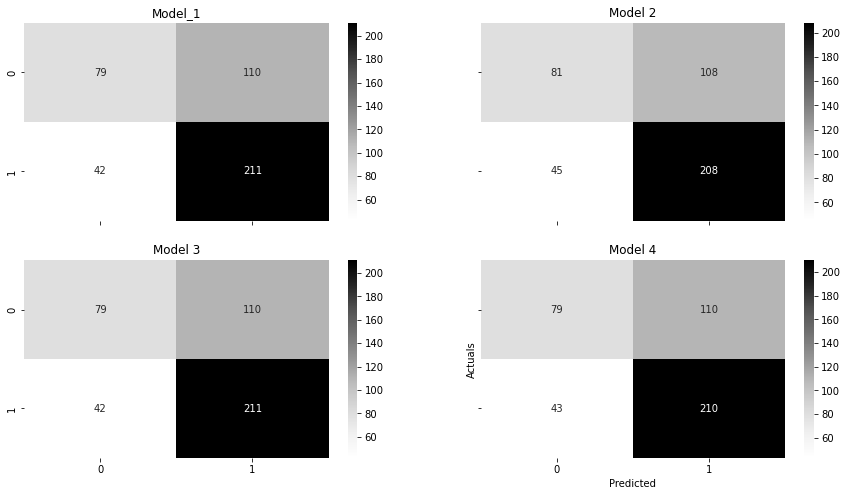

In [361]:
f,a =  plt.subplots(2,2,sharex=True,sharey=True,squeeze=False)

#Plotting confusion matrix for the different models for the Training Data

plot_0 = sns.heatmap((metrics.confusion_matrix(Test['Contraceptive_method_used'],model_1_test_class)),annot=True,fmt='.5g',cmap='Greys',ax=a[0][0]);
a[0][0].set_title('Model_1');
plt.xlabel('Predicted')
plt.ylabel('Actuals')


plot_1 = sns.heatmap((metrics.confusion_matrix(Test['Contraceptive_method_used'],model_2_test_class)),annot=True,fmt='.5g',cmap='Greys',ax=a[0][1]);
a[0][1].set_title('Model 2');
plt.xlabel('Predicted')
plt.ylabel('Actuals');

plot_2 = sns.heatmap((metrics.confusion_matrix(Test['Contraceptive_method_used'],model_3_test_class)),annot=True,fmt='.5g',cmap='Greys',ax=a[1][0]);
a[1][0].set_title('Model 3');
plt.xlabel('Predicted')
plt.ylabel('Actuals');

plot_3 = sns.heatmap((metrics.confusion_matrix(Test['Contraceptive_method_used'],model_4_test_class)),annot=True,fmt='.5g',cmap='Greys',ax=a[1][1]);
a[1][1].set_title('Model 4');
plt.xlabel('Predicted');
plt.ylabel('Actuals');



In [342]:
print('Model 1')
tn, fp, fn, tp = metrics.confusion_matrix(Test['Contraceptive_method_used'],model_1_test_class).ravel()
print('True Negative:',tn,'\n''False Positives:' ,fp,'\n''False Negatives:', fn,'\n''True Positives:', tp,'\n\n')

print('Model 2')
tn, fp, fn, tp = metrics.confusion_matrix(Test['Contraceptive_method_used'],model_2_test_class).ravel()
print('True Negative:',tn,'\n''False Positives:' ,fp,'\n''False Negatives:', fn,'\n''True Positives:', tp,'\n\n')

print('Model 3')
tn, fp, fn, tp = metrics.confusion_matrix(Test['Contraceptive_method_used'],model_3_test_class).ravel()
print('True Negative:',tn,'\n''False Positives:' ,fp,'\n''False Negatives:', fn,'\n''True Positives:', tp,'\n\n')

print('Model 4')
tn, fp, fn, tp = metrics.confusion_matrix(Test['Contraceptive_method_used'],model_4_test_class).ravel()
print('True Negative:',tn,'\n''False Positives:' ,fp,'\n''False Negatives:', fn,'\n''True Positives:',tp)

Model 1
True Negative: 79 
False Positives: 110 
False Negatives: 42 
True Positives: 211 


Model 2
True Negative: 81 
False Positives: 108 
False Negatives: 45 
True Positives: 208 


Model 3
True Negative: 79 
False Positives: 110 
False Negatives: 42 
True Positives: 211 


Model 4
True Negative: 79 
False Positives: 110 
False Negatives: 43 
True Positives: 210


In [385]:
print('Accuracy Score - Model 1')
print('Training:', metrics.accuracy_score(Train['Contraceptive_method_used'],model_1_train_class))
print('Testing: ', metrics.accuracy_score(Test['Contraceptive_method_used'],model_1_test_class))

print('\nAccuracy Score - Model 2')
print('Training:', metrics.accuracy_score(Train['Contraceptive_method_used'],model_2_train_class))
print('Testing: ', metrics.accuracy_score(Test['Contraceptive_method_used'],model_2_test_class))

print('\nAccuracy Score - Model 3')
print('Training:', metrics.accuracy_score(Train['Contraceptive_method_used'],model_3_train_class))
print('Testing: ', metrics.accuracy_score(Test['Contraceptive_method_used'],model_3_test_class))

print('\nAccuracy Score - Model 4')
print('Training:', metrics.accuracy_score(Train['Contraceptive_method_used'],model_4_train_class))
print('Testing: ', metrics.accuracy_score(Test['Contraceptive_method_used'],model_4_test_class))

Accuracy Score - Model 1
Training: 0.6808923375363725
Testing:  0.6561085972850679

Accuracy Score - Model 2
Training: 0.6760426770126091
Testing:  0.6538461538461539

Accuracy Score - Model 3
Training: 0.6760426770126091
Testing:  0.6561085972850679

Accuracy Score - Model 4
Training: 0.6750727449078564
Testing:  0.6538461538461539


In [343]:
print('Model 1')
print(metrics.classification_report(Test['Contraceptive_method_used'],model_1_test_class),'\n')

print('Model 2')
print(metrics.classification_report(Test['Contraceptive_method_used'],model_2_test_class),'\n')

print('Model 3')
print(metrics.classification_report(Test['Contraceptive_method_used'],model_3_test_class))

print('Model 4')
print(metrics.classification_report(Test['Contraceptive_method_used'],model_4_test_class))



Model 1
              precision    recall  f1-score   support

           0       0.65      0.42      0.51       189
           1       0.66      0.83      0.74       253

    accuracy                           0.66       442
   macro avg       0.66      0.63      0.62       442
weighted avg       0.66      0.66      0.64       442
 

Model 2
              precision    recall  f1-score   support

           0       0.64      0.43      0.51       189
           1       0.66      0.82      0.73       253

    accuracy                           0.65       442
   macro avg       0.65      0.63      0.62       442
weighted avg       0.65      0.65      0.64       442
 

Model 3
              precision    recall  f1-score   support

           0       0.65      0.42      0.51       189
           1       0.66      0.83      0.74       253

    accuracy                           0.66       442
   macro avg       0.66      0.63      0.62       442
weighted avg       0.66      0.66      0.64   

### Check the summary statistics of the AUC-ROC curve for all the four Logistic Regression Models built for test data.

In [344]:
from pylab import rcParams
rcParams['figure.figsize'] = 15,8

Model 1 AUC: 0.66534


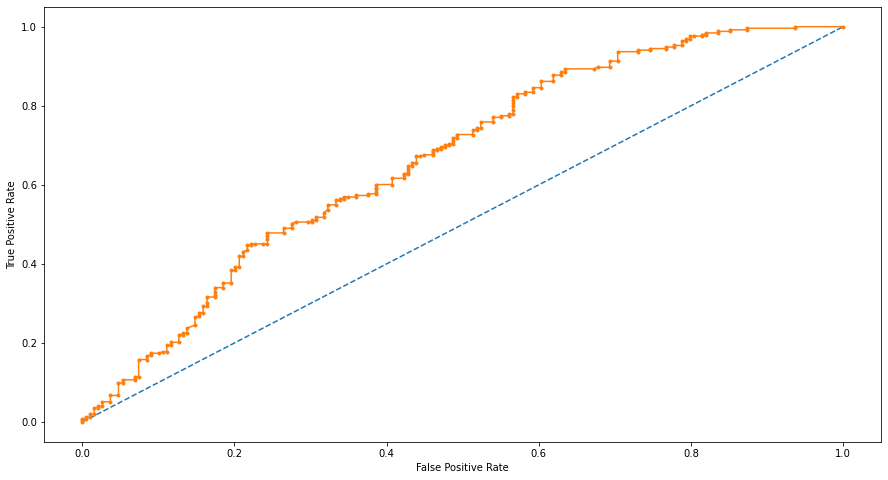

In [345]:
# AUC and ROC for the model 1


# calculating on the basis of a person not defaulting
# calculate AUC
auc = metrics.roc_auc_score(Test['Contraceptive_method_used'],model_1_test_probabilities[:, 1])#keeping only the probabilities for the desired class outcome
print('Model 1 AUC: %.5f' % auc)
# # calculate roc curve
# from sklearn.metrics import roc_curve
fpr, tpr, thresholds = metrics.roc_curve(Test['Contraceptive_method_used'],model_1_test_probabilities[:, 1])#keeping only the probabilities for the desired 
#class outcome
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the plot
plt.show()


Model 2 AUC: 0.66652


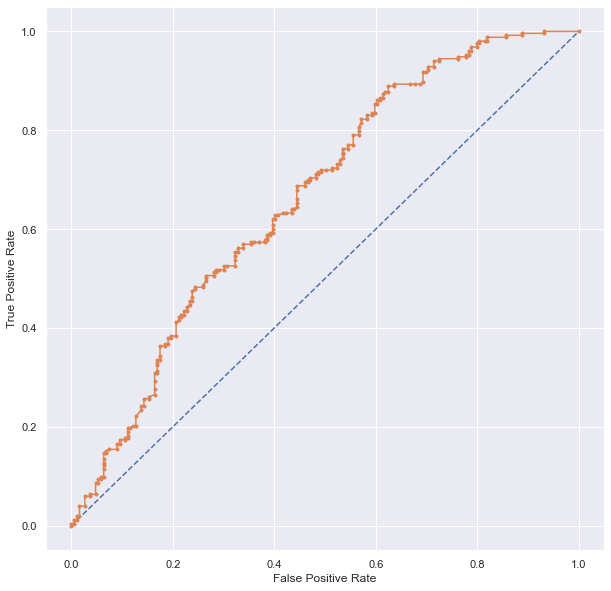

In [637]:
# AUC and ROC for the model 2


# calculating on the basis of a person not defaulting
# calculate AUC
auc = metrics.roc_auc_score(Test['Contraceptive_method_used'],model_2_test_probabilities[:, 1])#keeping only the probabilities for the desired class outcome
print('Model 2 AUC: %.5f' % auc)
# # calculate roc curve
# from sklearn.metrics import roc_curve
fpr, tpr, thresholds = metrics.roc_curve(Test['Contraceptive_method_used'],model_2_test_probabilities[:, 1])#keeping only the probabilities for the desired 
#class outcome
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the plot
plt.show()


Model 3 AUC: 0.66673


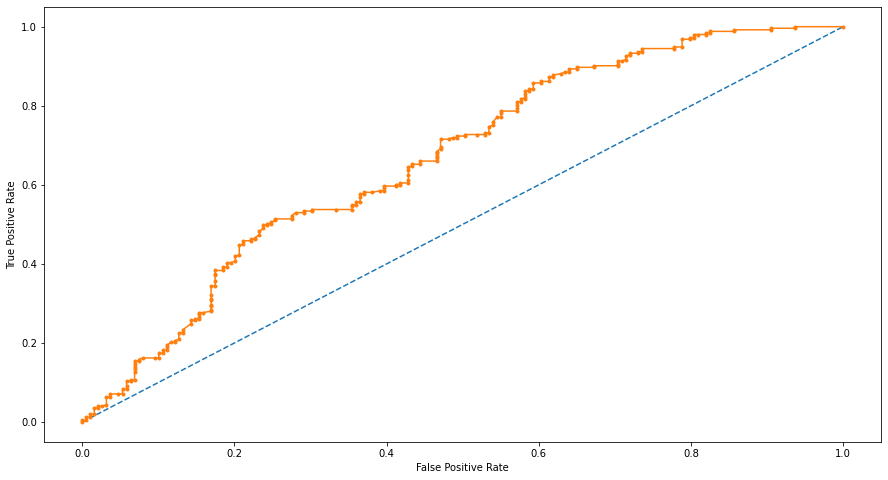

In [346]:
# AUC and ROC for the model 3


# calculating on the basis of a person not defaulting
# calculate AUC
auc = metrics.roc_auc_score(Test['Contraceptive_method_used'],model_3_test_probabilities[:, 1])#keeping only the probabilities for the desired class outcome
print('Model 3 AUC: %.5f' % auc)
# # calculate roc curve
# from sklearn.metrics import roc_curve
fpr, tpr, thresholds = metrics.roc_curve(Test['Contraceptive_method_used'],model_3_test_probabilities[:, 1])#keeping only the probabilities for the desired 
#class outcome
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the plot
plt.show()


Model 4 AUC: 0.66705


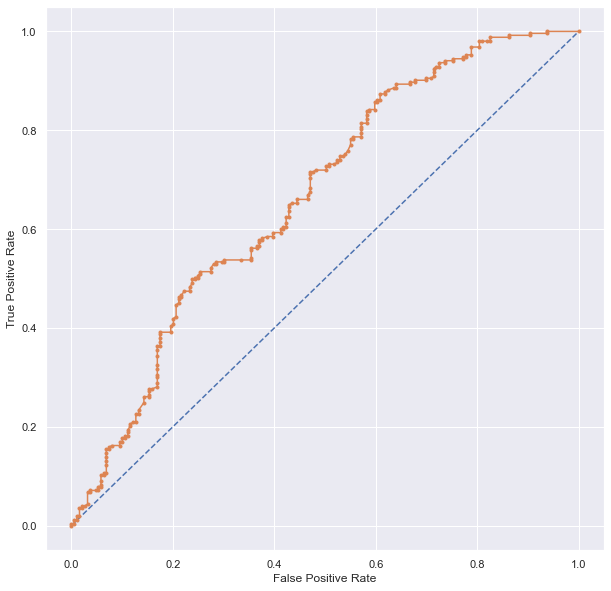

In [634]:
# AUC and ROC for the model 4


# calculating on the basis of a person not defaulting
# calculate AUC
auc = metrics.roc_auc_score(Test['Contraceptive_method_used'],model_4_test_probabilities[:, 1])#keeping only the probabilities for the desired class outcome
print('Model 4 AUC: %.5f' % auc)
# # calculate roc curve
# from sklearn.metrics import roc_curve
fpr, tpr, thresholds = metrics.roc_curve(Test['Contraceptive_method_used'],model_4_test_probabilities[:, 1])#keeping only the probabilities for the desired 
#class outcome
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
# show the plot
plt.show()

### 2.4 Inference: Basis on these predictions, what are the insights and recommendations.

In [ ]:
Refer business report